# Compare labels after fine tuning for training_27 and training_28

In [1]:
import pandas as pd
from pySankey.sankey import sankey
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

## 1. All slides labels

In [2]:
df_labels = pd.read_csv('/Volumes/DD1_FGS/MICS/data_HE2CellType/CT_DS/analyze_trained_model/trained_labels_comparison.csv')
df_labels = df_labels[~df_labels['slide_id'].isin(['bone_marrow_s0', 'bone_marrow_s1', 'bone_s0', 'brain_s0'])] # remove slides not in training
df_labels

/var/folders/ff/llzyqd_s78v1k8vywvjxp5_r0000gn/T/ipykernel_99285/2058627885.py:1: DtypeWarning: Columns (7,9) have mixed types. Specify dtype option on import or set low_memory=False.
  df_labels = pd.read_csv('/Volumes/DD1_FGS/MICS/data_HE2CellType/CT_DS/analyze_trained_model/trained_labels_comparison.csv')


,slide_id,cell_id,final_label_nuclei,final_label_cells,PanNuke_label,PanNuke_proba,final_label_combined,t27_cell_type,t27_proba,t28_cell_type,t28_proba
1153301,breast_s0,aaaaaaaa-1,Epithelial,Epithelial,Background,1.000000,Epithelial,Background,1.000000,Background,1.000000
1153302,breast_s0,aaaaaaab-1,Epithelial,Epithelial,Background,1.000000,Epithelial,Background,1.000000,Background,1.000000
1153303,breast_s0,aaaaaaac-1,Fibroblast_Myofibroblast,Blood_vessel,Connective,0.790244,Fibroblast_Myofibroblast,Blood_vessel,0.860163,Stromal,0.804878
1153304,breast_s0,aaaaaaad-1,Epithelial,Epithelial,Neoplastic,0.632588,Epithelial,Epithelial,0.974441,Epithelial,0.982428
1153305,breast_s0,aaaaaaae-1,Epithelial,Epithelial,Neoplastic,0.773073,Epithelial,Epithelial,0.903366,Epithelial,0.885993
...,...,...,...,...,...,...,...,...,...,...,...
11207684,tonsil_s1,aaandahp-1,B_Plasma,B_Plasma,Neoplastic,0.427500,B_Plasma,B_Plasma,0.995000,Immune,0.967500
11207685,tonsil_s1,aaandaia-1,T_NK,T_NK,Inflammatory,0.893939,T_NK,T_NK,1.000000,Immune,1.000000
11207686,tonsil_s1,aaandaib-1,T_NK,T_NK,Inflammatory,0.814590,T_NK,T_NK,0.910334,Immune,0.978723
11207687,tonsil_s1,aaandaic-1,Myeloid,Myeloid,Inflammatory,0.330479,Myeloid,Myeloid,0.383562,Immune,0.854452


In [3]:
# Number of NaN values
df_labels.isna().sum(axis=0)

slide_id                  0
cell_id                   0
final_label_nuclei        0
final_label_cells         0
PanNuke_label             0
PanNuke_proba             0
final_label_combined      0
t27_cell_type           314
t27_proba               314
t28_cell_type           314
t28_proba               314
dtype: int64

In [4]:
df_labels = df_labels.fillna("Unknown") 

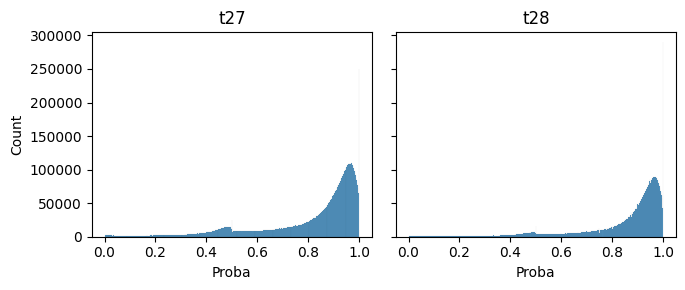

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(7, 3), sharey=True)

# t27 subplot
sns.histplot(df_labels.loc[~df_labels['t27_cell_type'].isin(['Background', 'Unknown']), 't27_proba'], ax=axes[0])
axes[0].set_title('t27')
axes[0].set_xlabel('Proba')
axes[0].set_ylabel('Count')

# t28 subplot
sns.histplot(df_labels.loc[~df_labels['t28_cell_type'].isin(['Background', 'Unknown']), 't28_proba'], ax=axes[1])
axes[1].set_title('t28')
axes[1].set_xlabel('Proba')
axes[1].set_ylabel('Count')

fig.tight_layout()
plt.show()

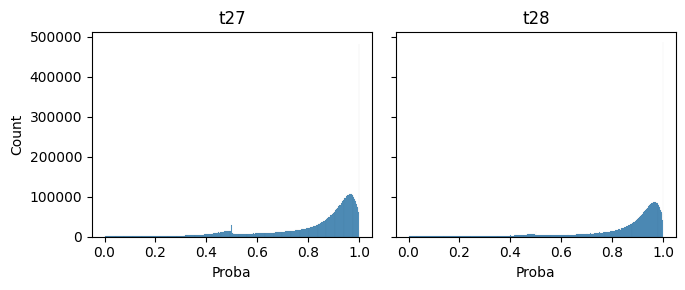

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(7, 3), sharey=True)

# t27 subplot
sns.histplot(df_labels.loc[~df_labels['t27_cell_type'].isin(['Unknown']), 't27_proba'], ax=axes[0])
axes[0].set_title('t27')
axes[0].set_xlabel('Proba')
axes[0].set_ylabel('Count')

# t28 subplot
sns.histplot(df_labels.loc[~df_labels['t28_cell_type'].isin(['Unknown']), 't28_proba'], ax=axes[1])
axes[1].set_title('t28')
axes[1].set_xlabel('Proba')
axes[1].set_ylabel('Count')

fig.tight_layout()
plt.show()

In [7]:
def compare(df_labels, final_label_name, training_id, slide_ids=None, exclude_Less10=False, normalize='index'): # for normalize, choose between 'index', 'columns', 'all', or None

    if slide_ids:
        df_labels_plot = df_labels[df_labels['slide_id'].isin(slide_ids)].copy()
    else:
        df_labels_plot = df_labels.copy()

    if exclude_Less10:
        df_labels_plot = df_labels_plot[df_labels_plot[final_label_name] != 'Less10']

    print(' '*20 + str(final_label_name) + ' '*50 + f'{training_id} label')
    sankey(df_labels_plot[final_label_name], df_labels_plot[f"{training_id}_cell_type"], fontsize=10)

    cross_tab = pd.crosstab(df_labels_plot[final_label_name], df_labels_plot[f"{training_id}_cell_type"], normalize=normalize).round(2)

    plt.figure(figsize=(10, 4))
    sns.heatmap(cross_tab, annot=True, cmap="Blues", cbar=False)
    plt.ylabel(f'{final_label_name}')
    plt.xlabel(f"{training_id}")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

                    final_label_cells                                                  t27 label


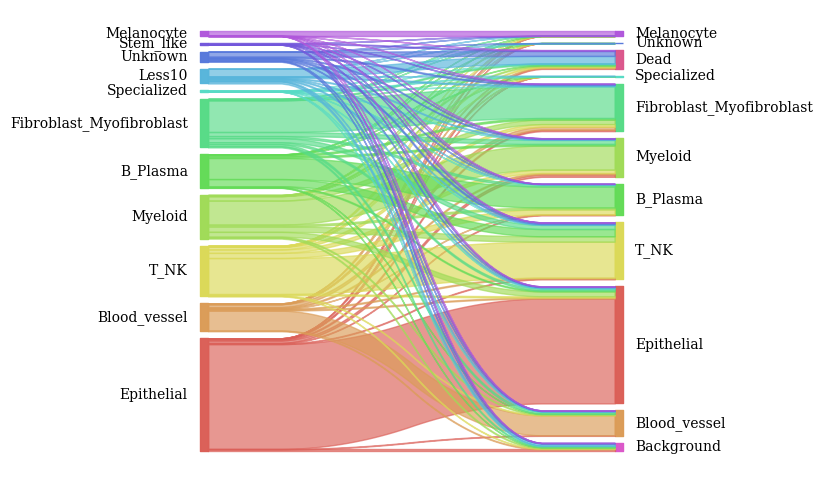

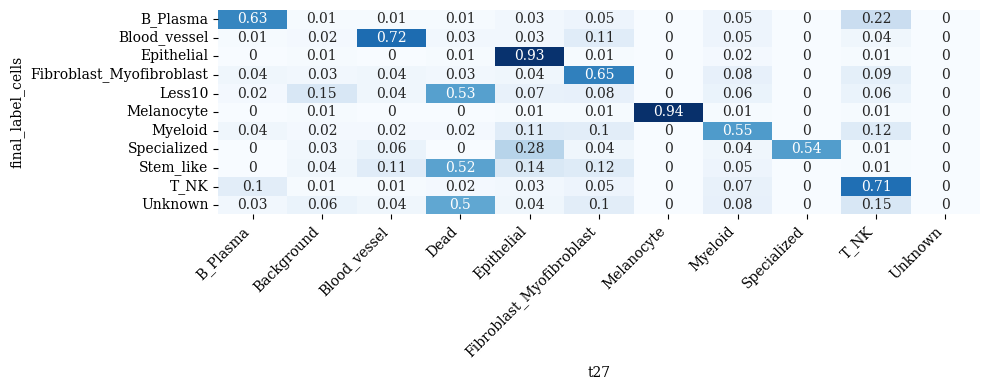

In [8]:
compare(df_labels, "final_label_cells", "t27", slide_ids=None, exclude_Less10=False, normalize='index')

                    final_label_cells                                                  t28 label


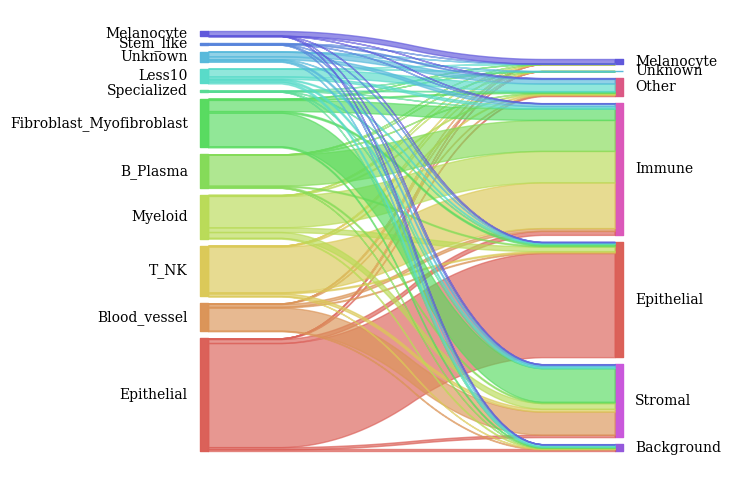

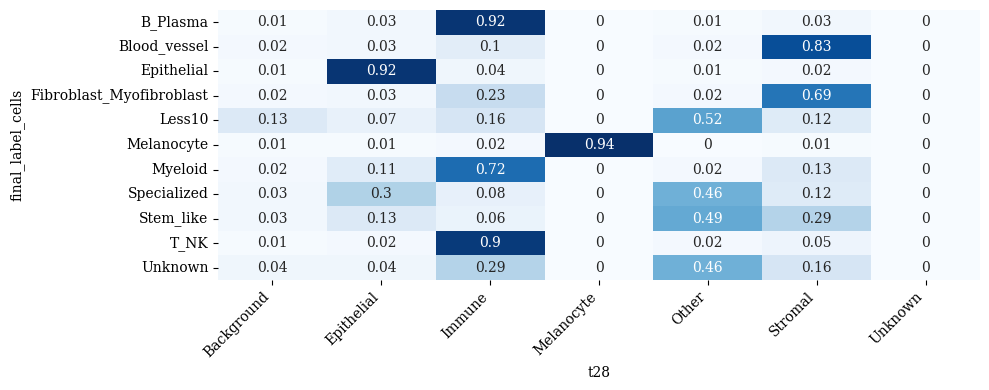

In [9]:
compare(df_labels, "final_label_cells", "t28", slide_ids=None, exclude_Less10=False, normalize='index')

## 2. For each slide

### breast_s0

In [10]:
slide_id = 'breast_s0'

                    final_label_cells                                                  t27 label


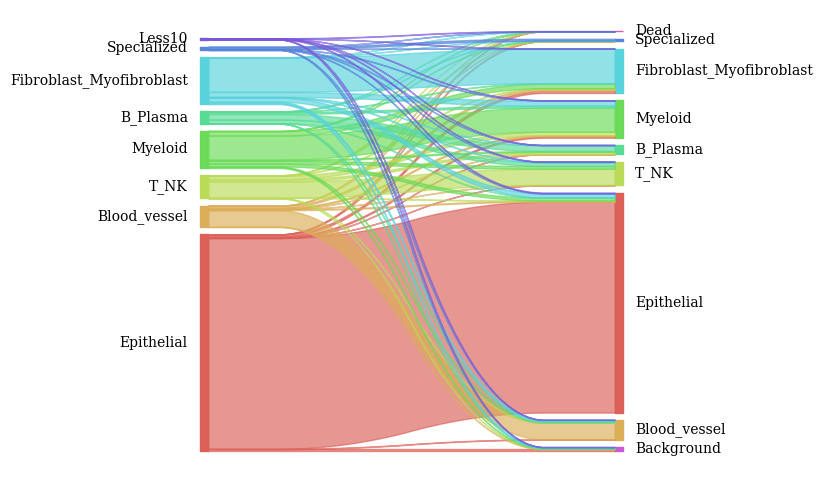

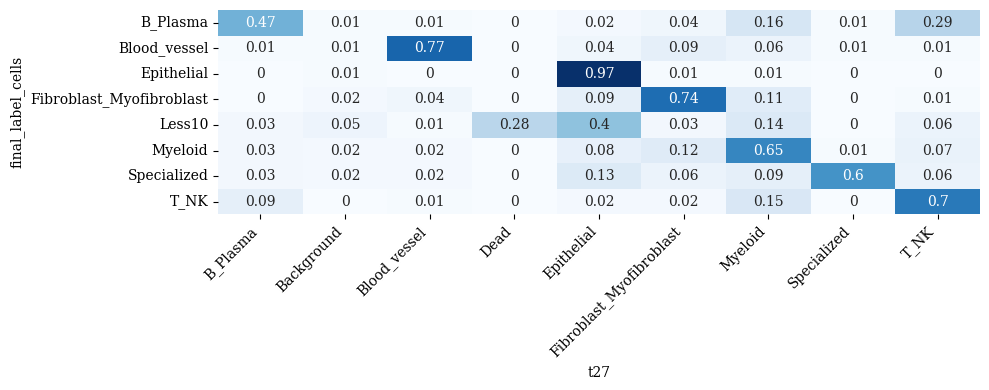

In [11]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


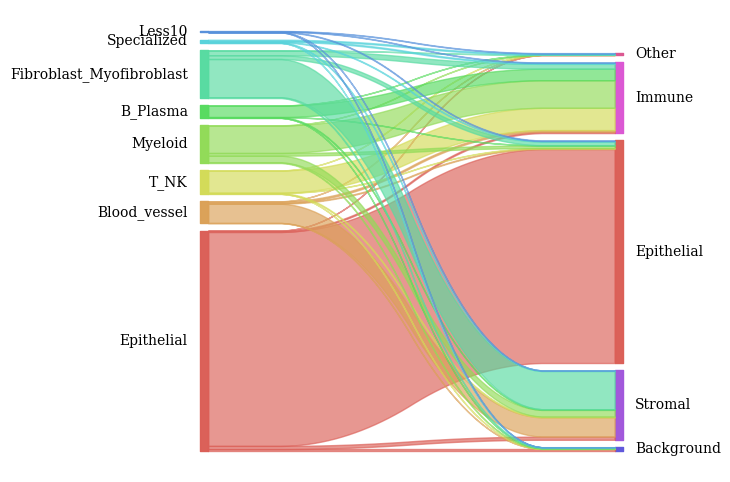

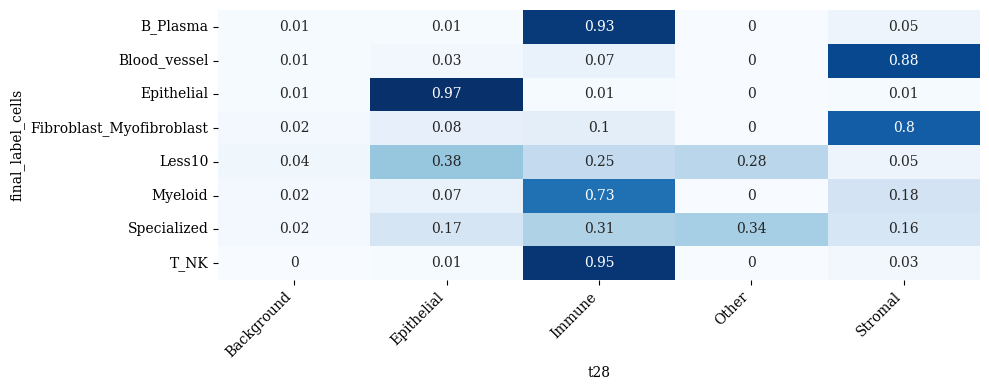

In [12]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### breast_s1

In [13]:
slide_id = 'breast_s1'

                    final_label_cells                                                  t27 label


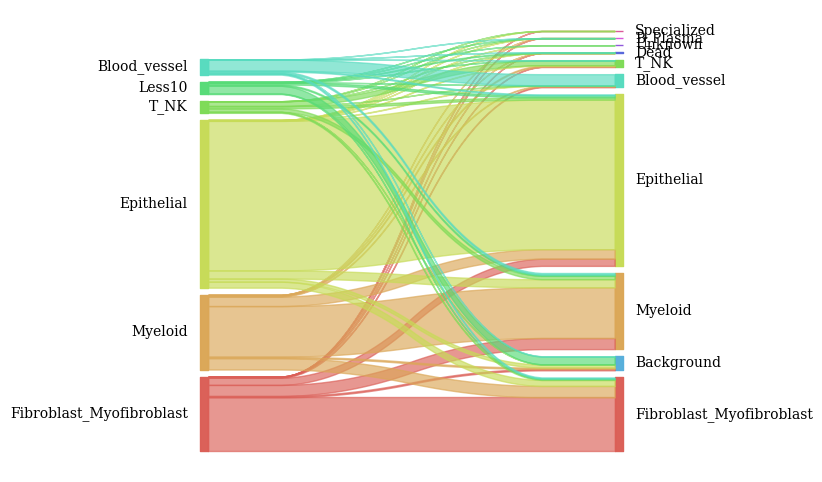

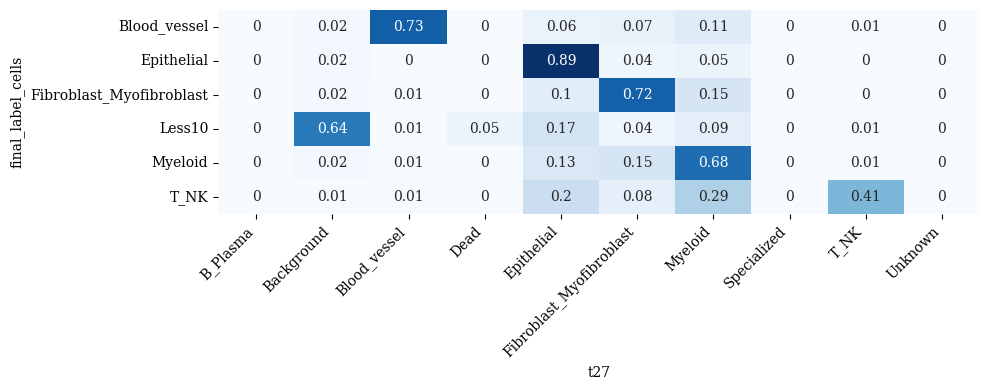

In [14]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


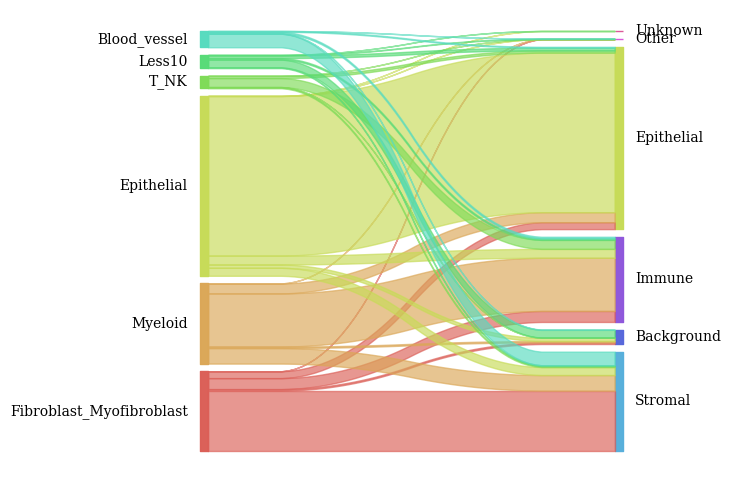

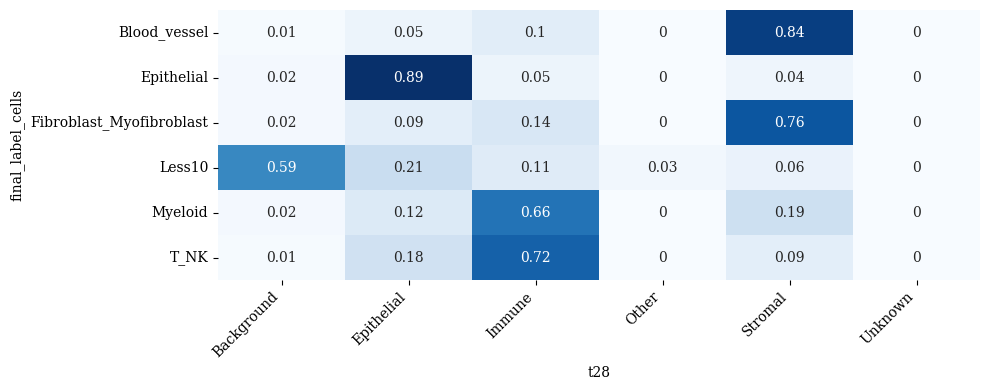

In [15]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### breast_s3

In [16]:
slide_id = 'breast_s3'

                    final_label_cells                                                  t27 label


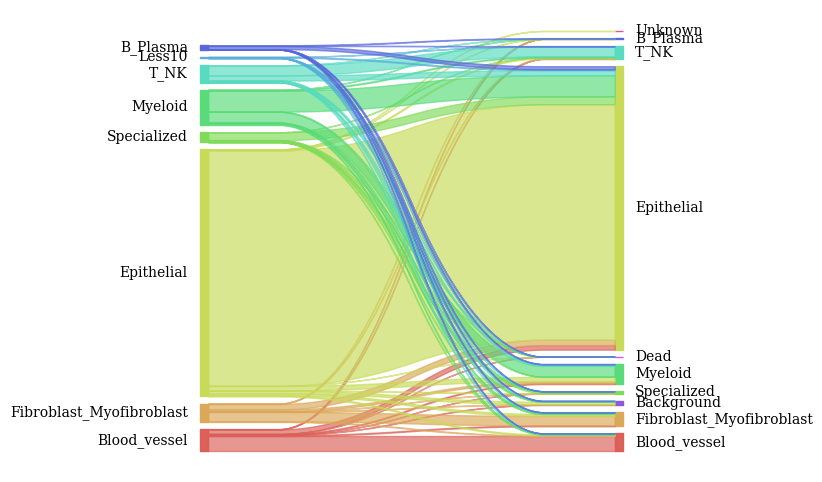

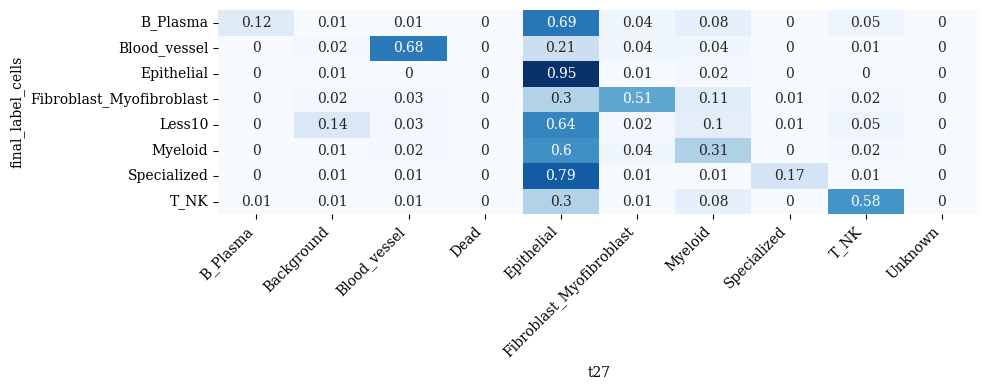

In [17]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


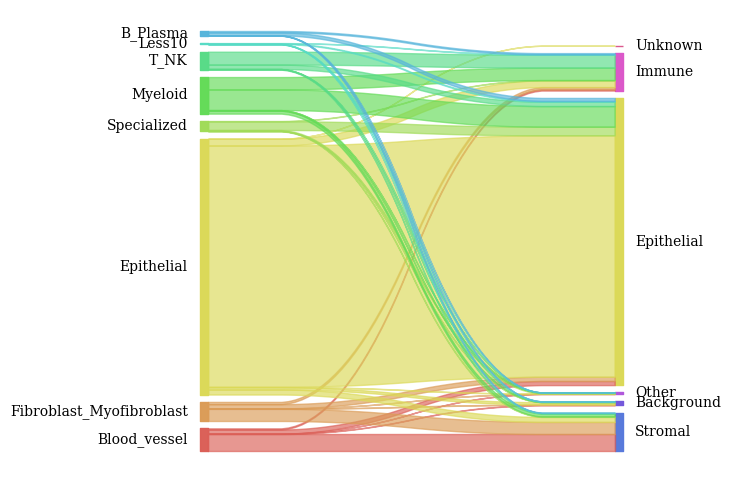

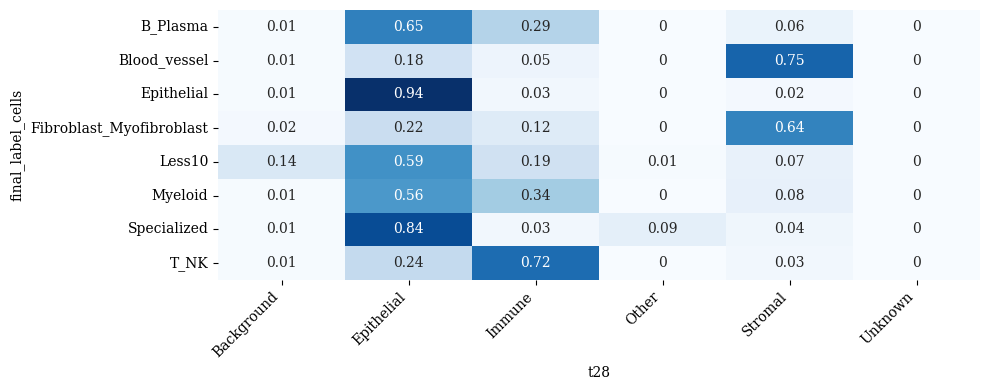

In [18]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### breast_s6

In [19]:
slide_id = 'breast_s6'

                    final_label_cells                                                  t27 label


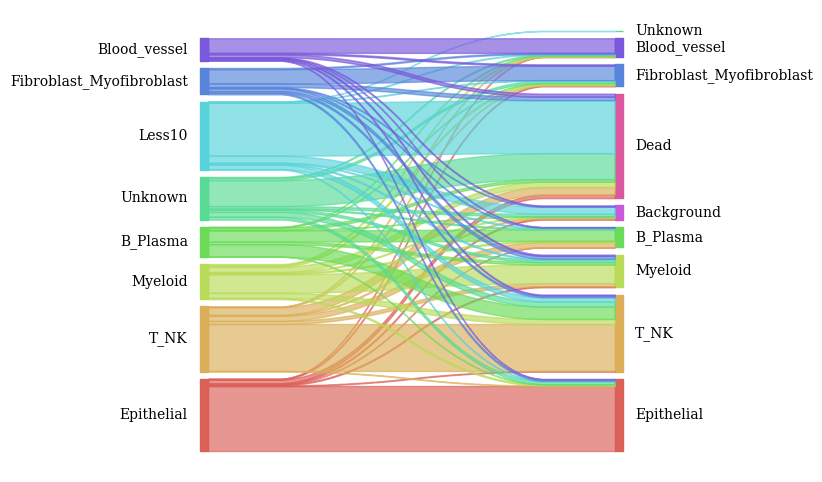

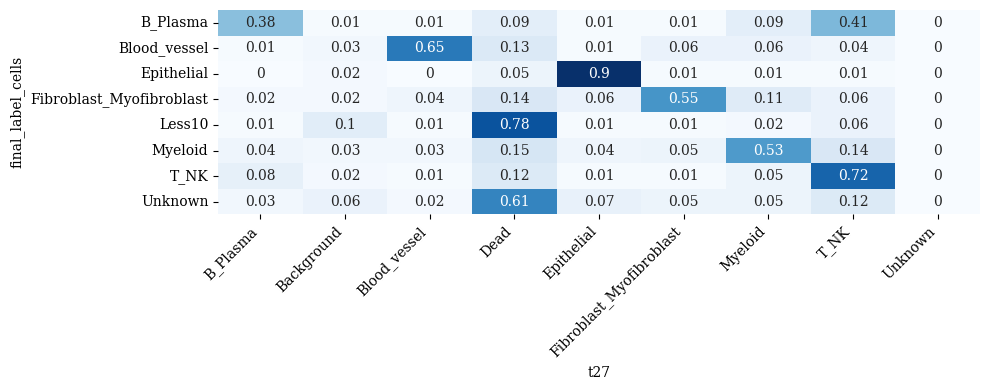

In [20]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


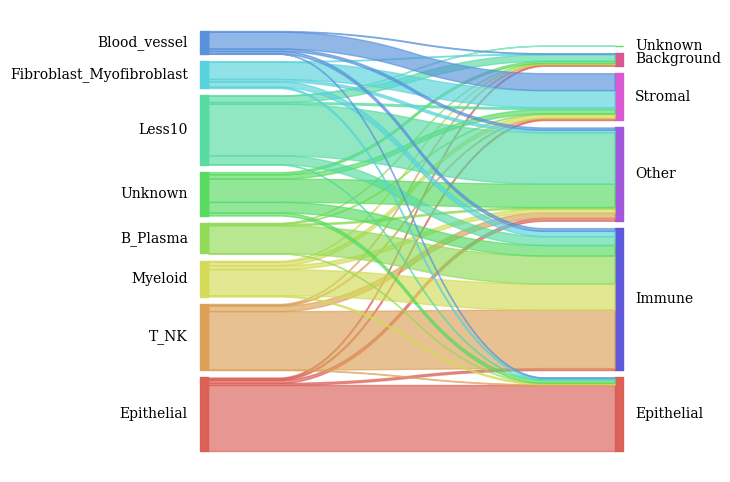

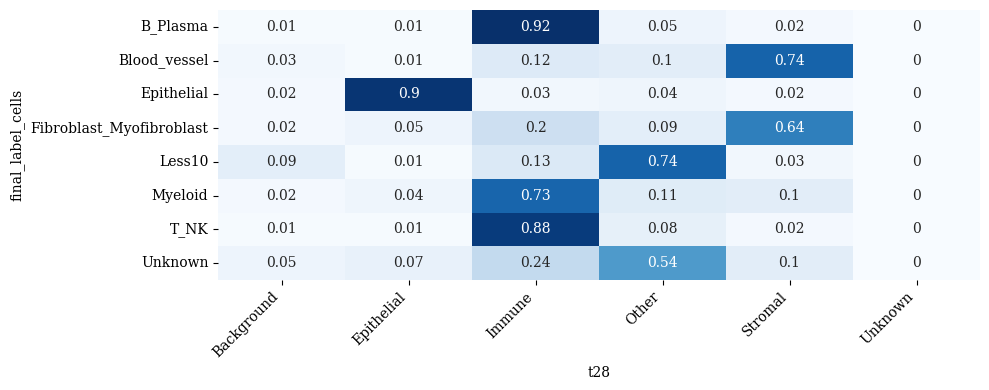

In [21]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### lung_s1

In [22]:
slide_id = 'lung_s1'

                    final_label_cells                                                  t27 label


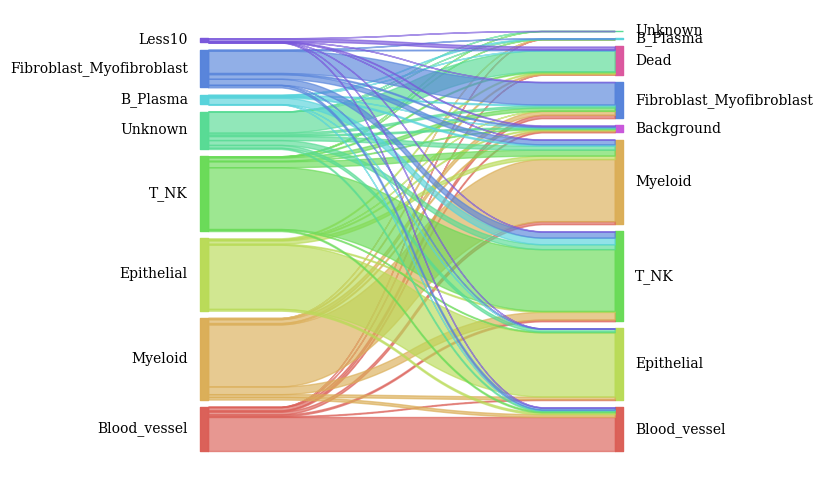

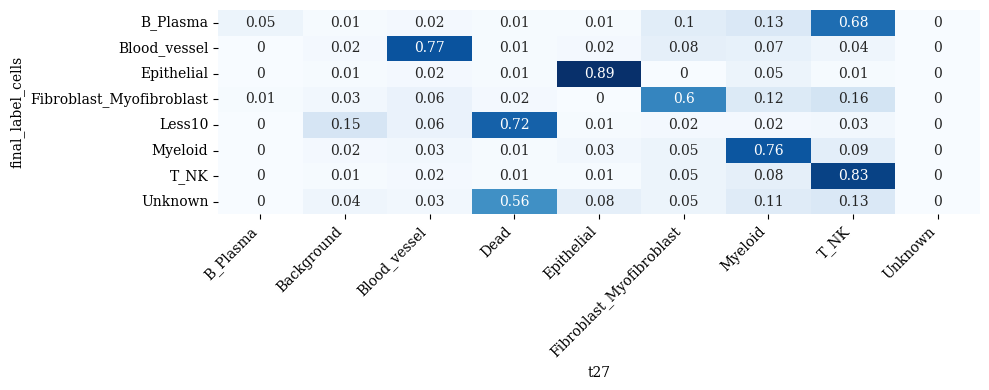

In [23]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


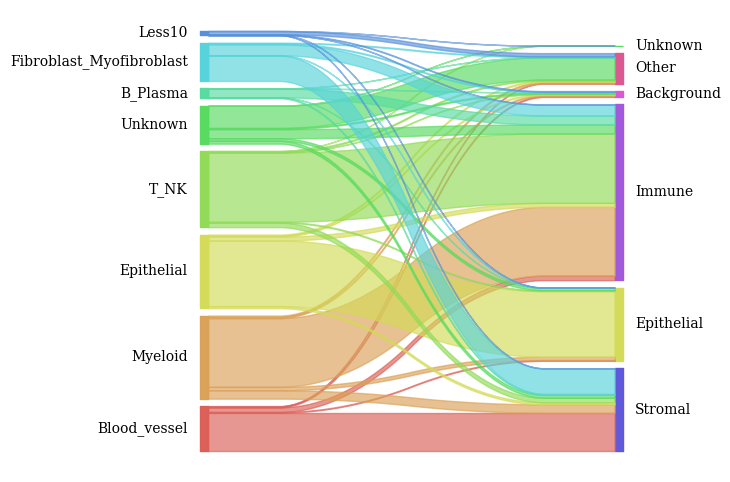

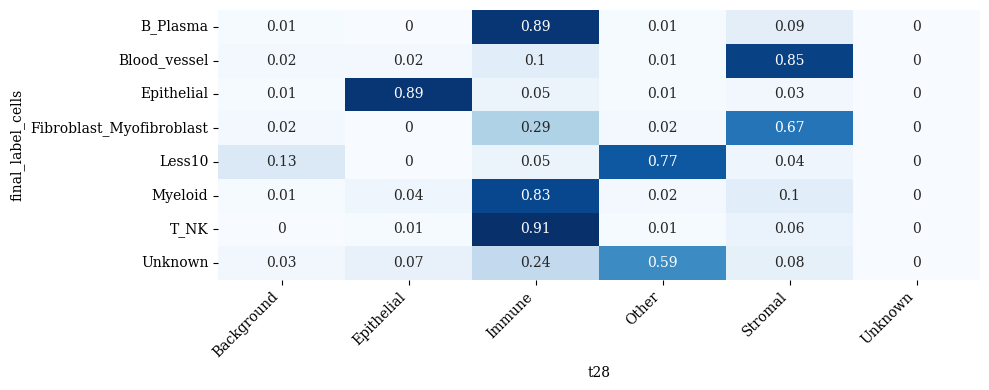

In [24]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### lung_s3

In [25]:
slide_id = 'lung_s3'

                    final_label_cells                                                  t27 label


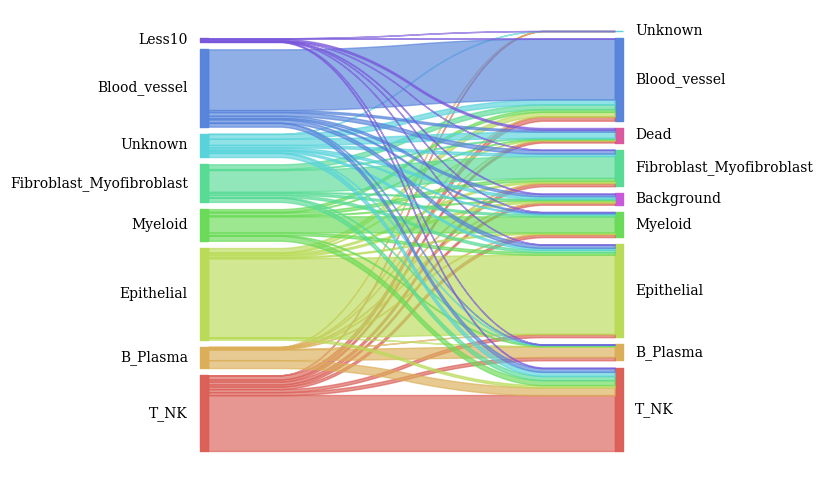

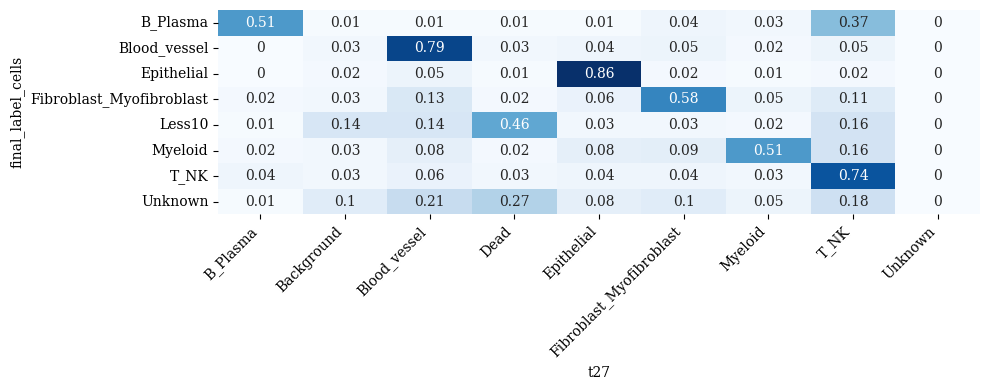

In [26]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


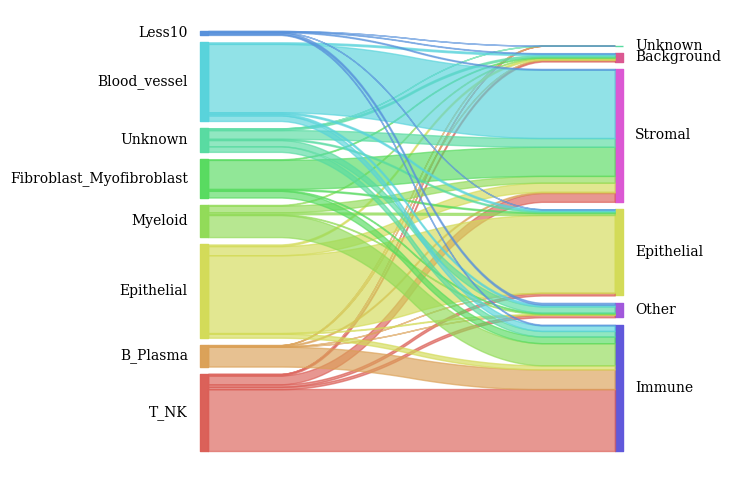

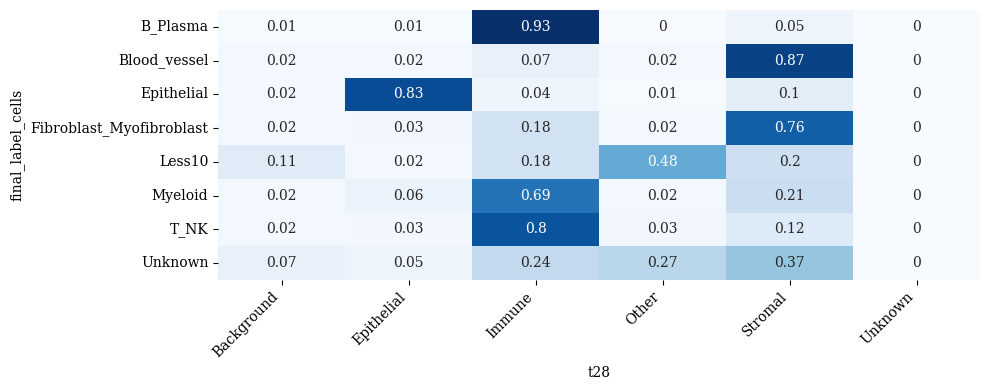

In [27]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### skin_s1

In [28]:
slide_id = 'skin_s1'

                    final_label_cells                                                  t27 label


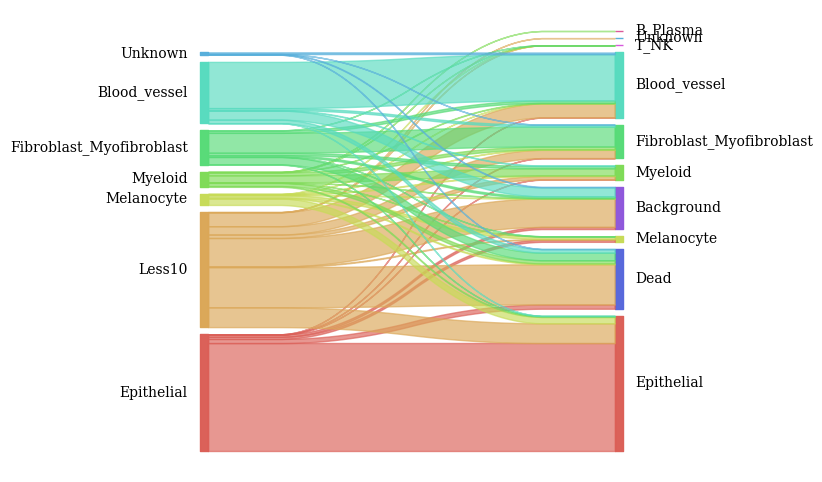

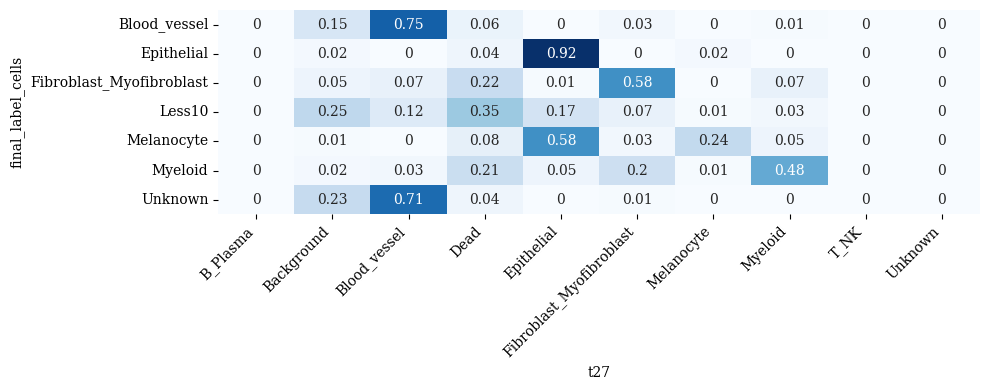

In [29]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


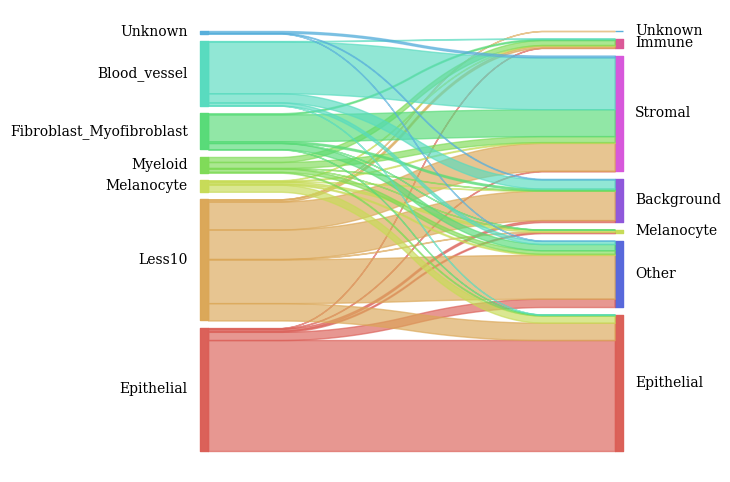

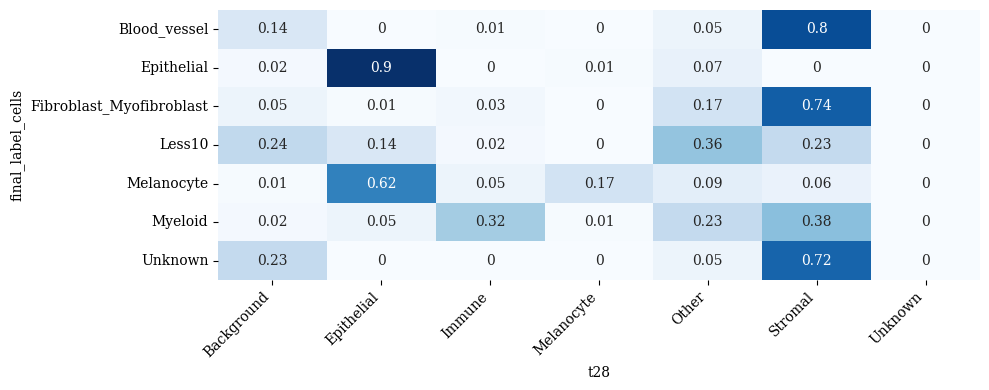

In [30]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### skin_s2

In [31]:
slide_id = 'skin_s2'

                    final_label_cells                                                  t27 label


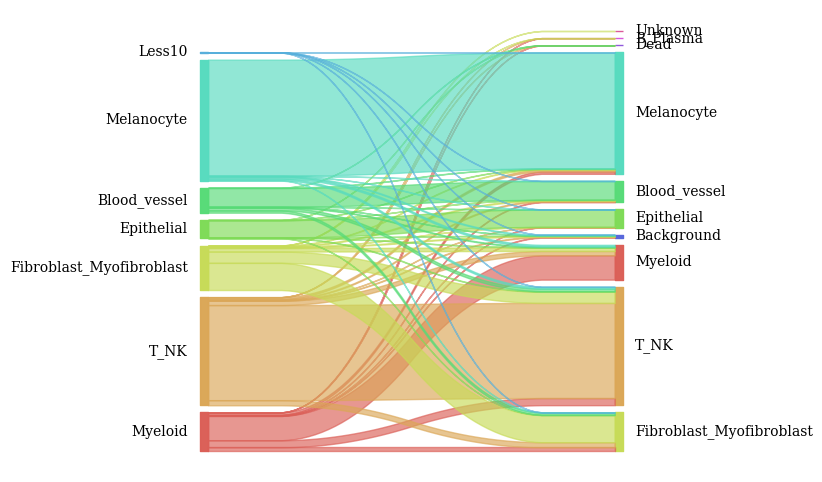

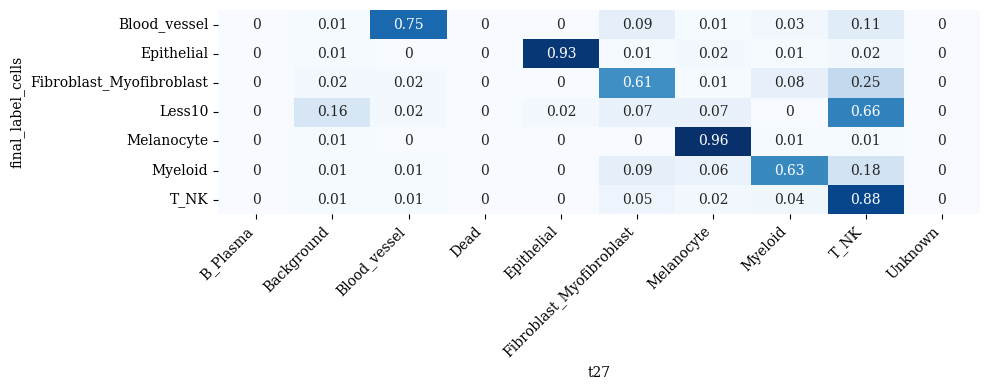

In [32]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


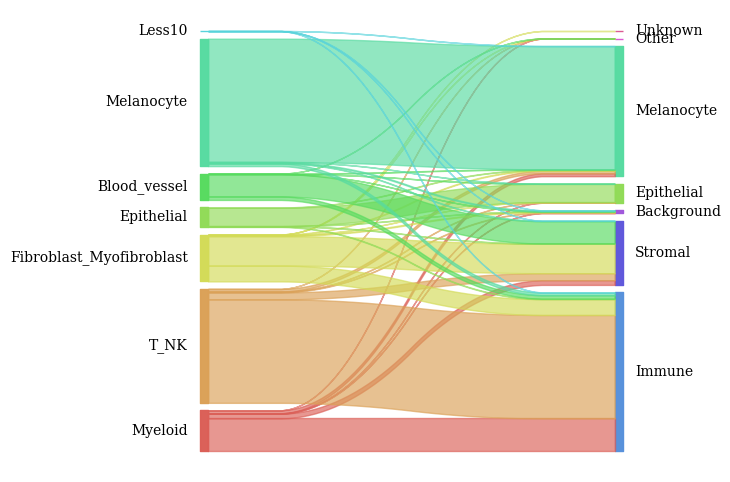

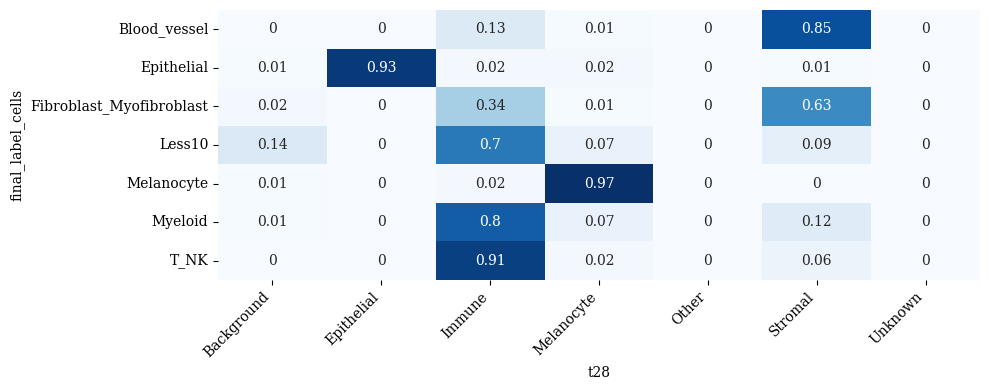

In [33]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### skin_s3

In [34]:
slide_id = 'skin_s3'

                    final_label_cells                                                  t27 label


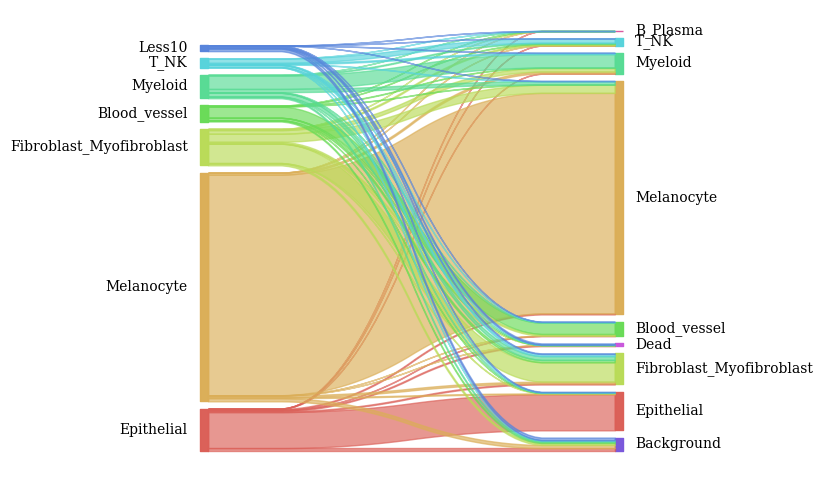

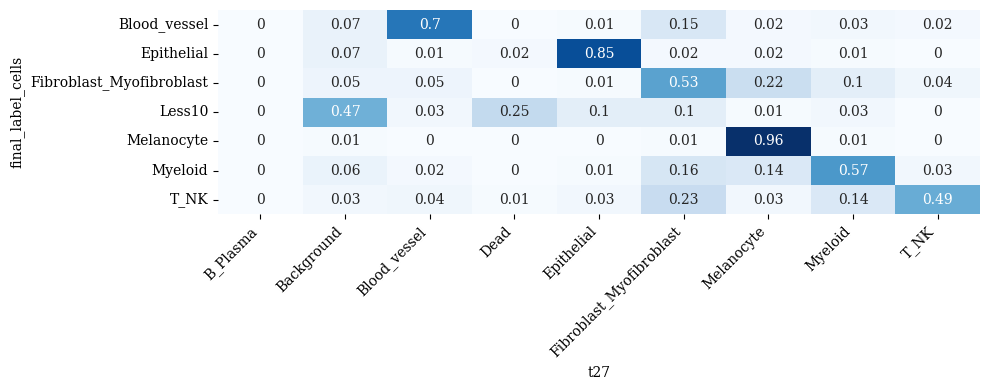

In [35]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


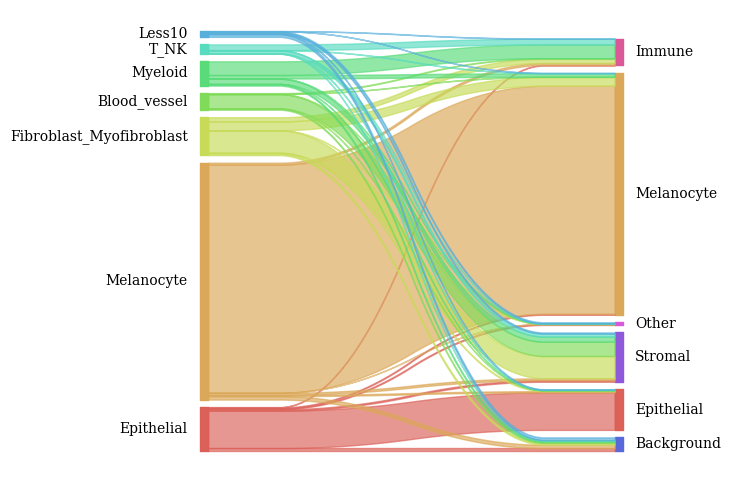

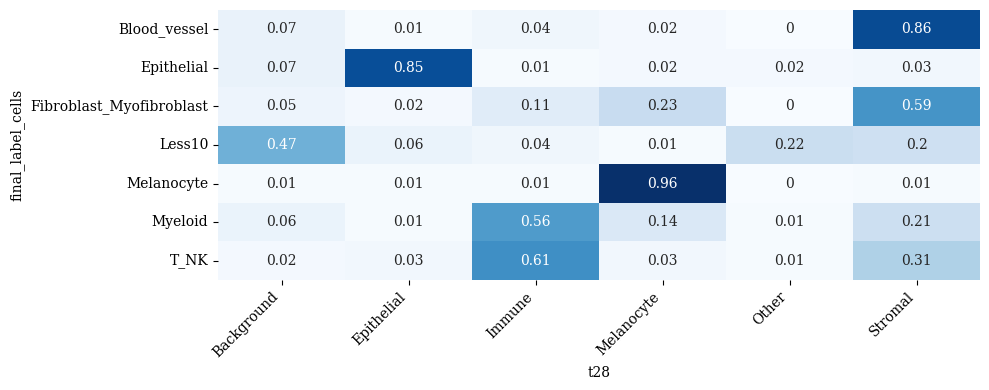

In [36]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### skin_s4

In [37]:
slide_id = 'skin_s4'

                    final_label_cells                                                  t27 label


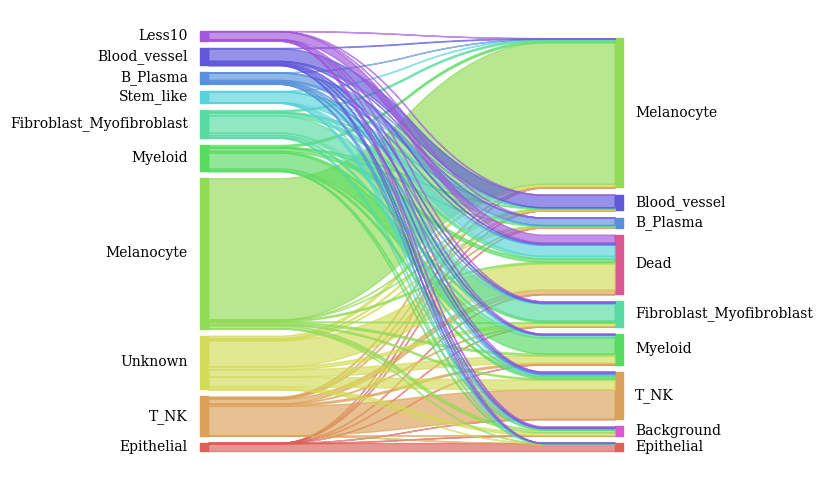

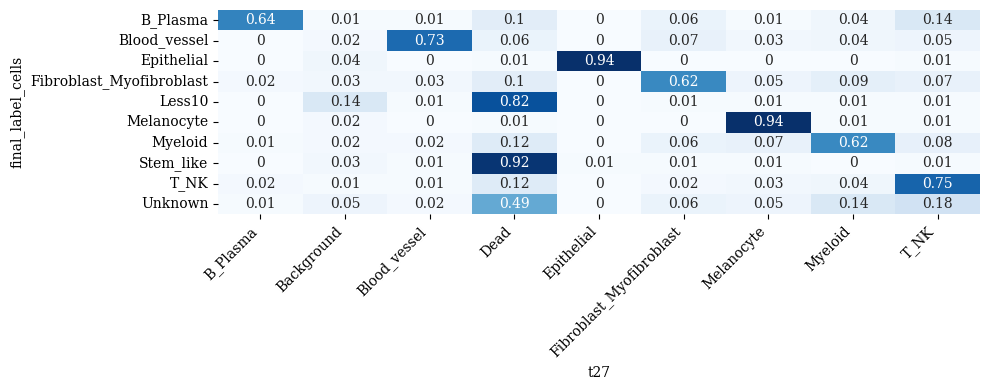

In [38]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


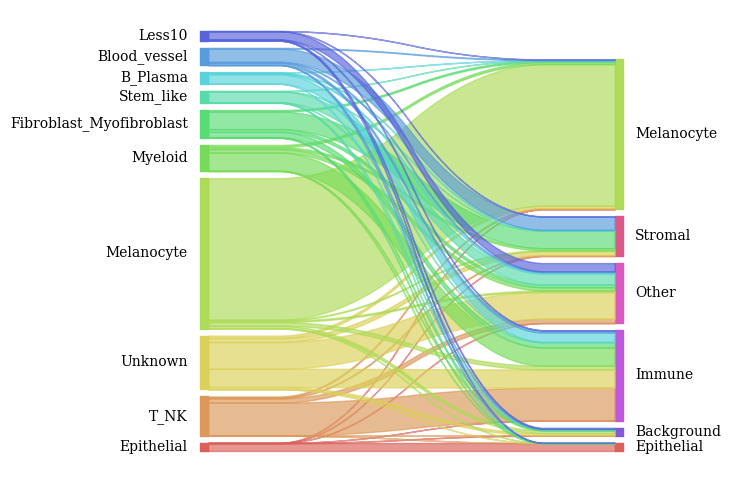

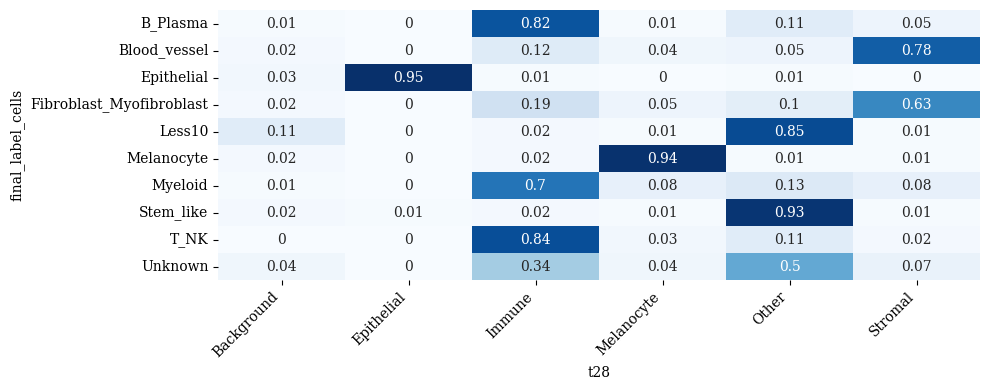

In [39]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### pancreatic_s0

In [40]:
slide_id = 'pancreatic_s0'

                    final_label_cells                                                  t27 label


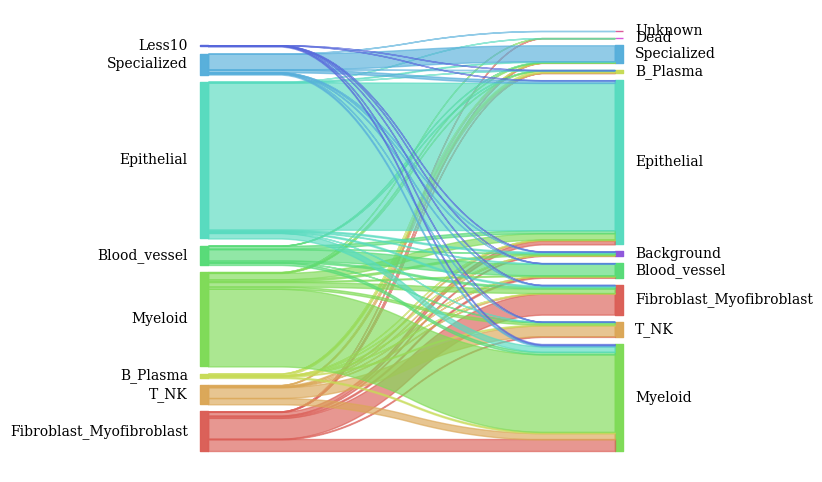

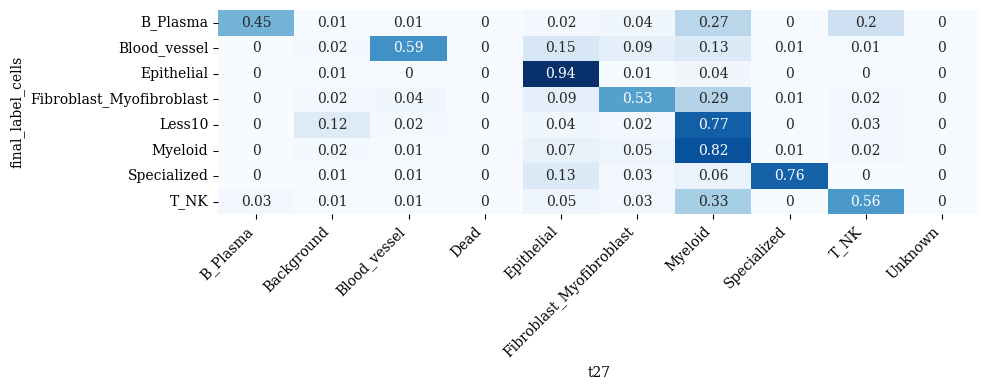

In [41]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


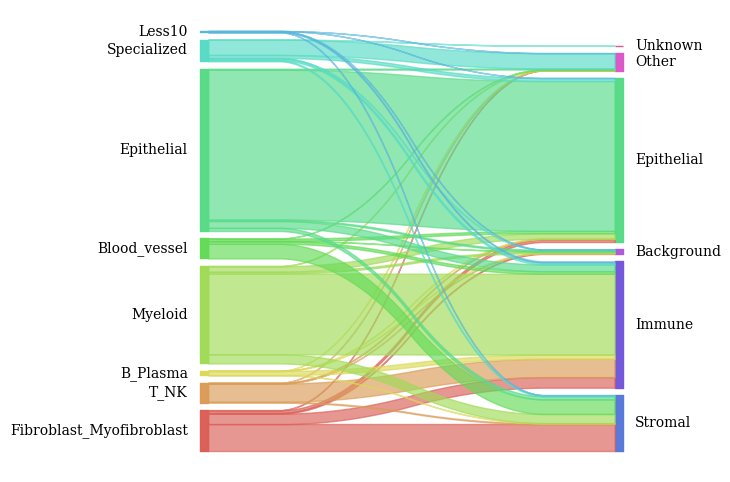

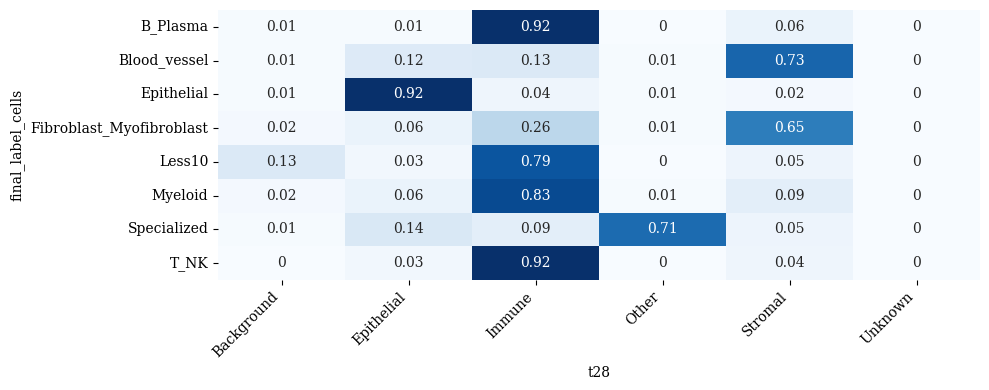

In [42]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### pancreatic_s1

In [43]:
slide_id = 'pancreatic_s1'

                    final_label_cells                                                  t27 label


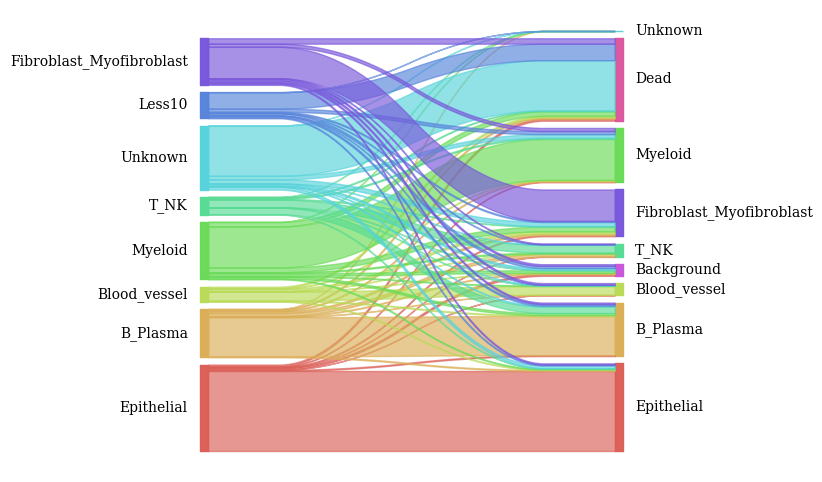

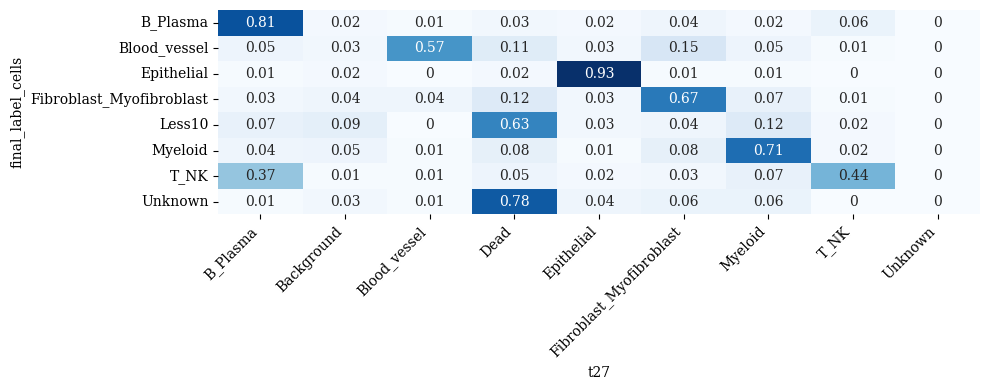

In [44]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


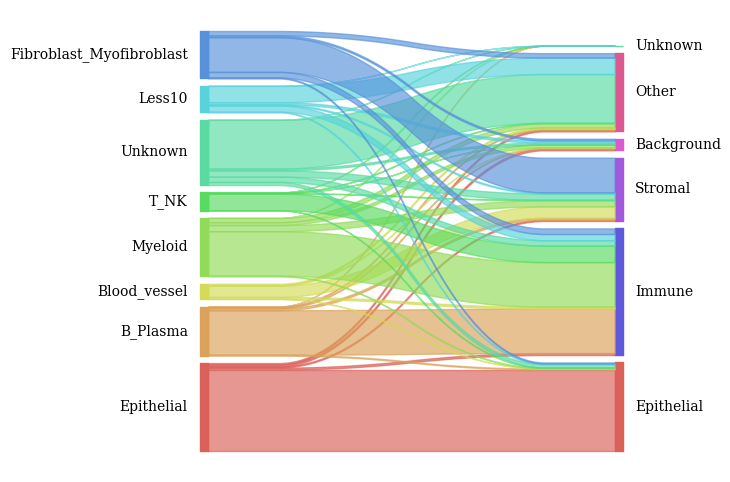

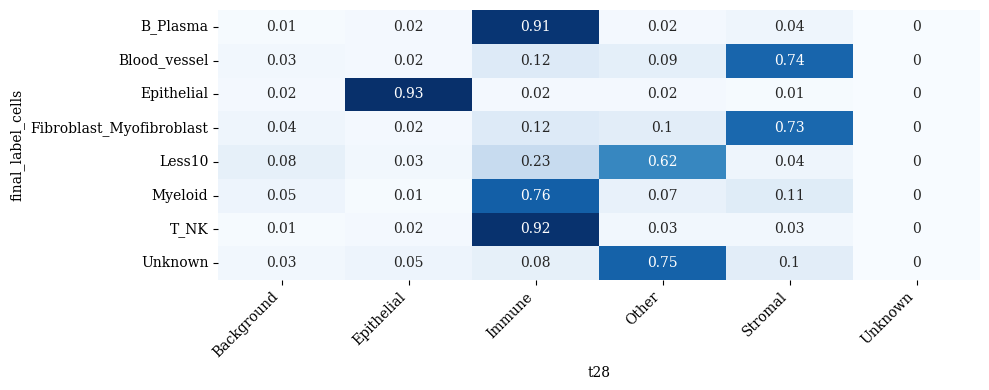

In [45]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### pancreatic_s2

In [46]:
slide_id = 'pancreatic_s2'

                    final_label_cells                                                  t27 label


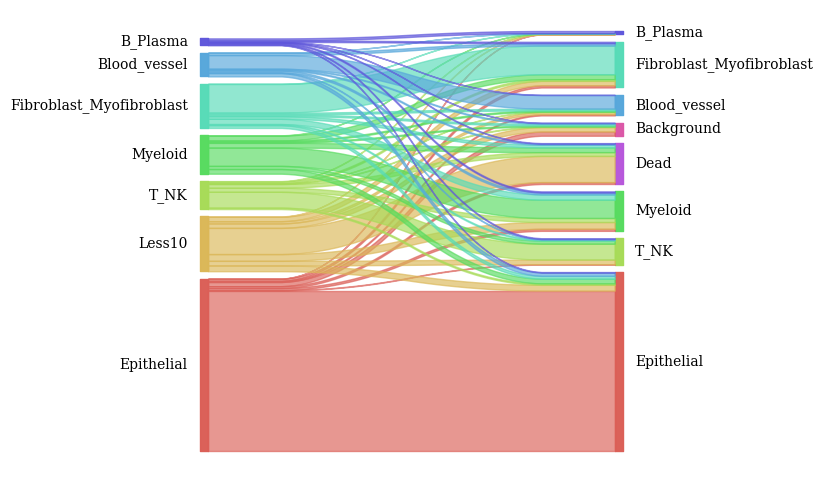

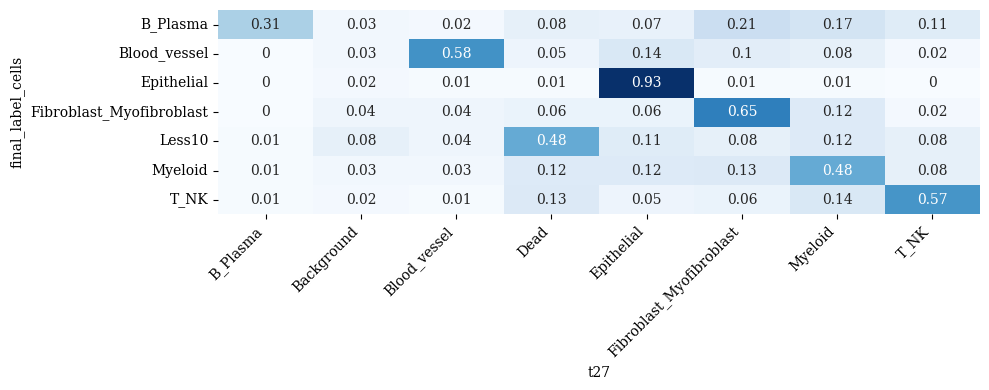

In [47]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


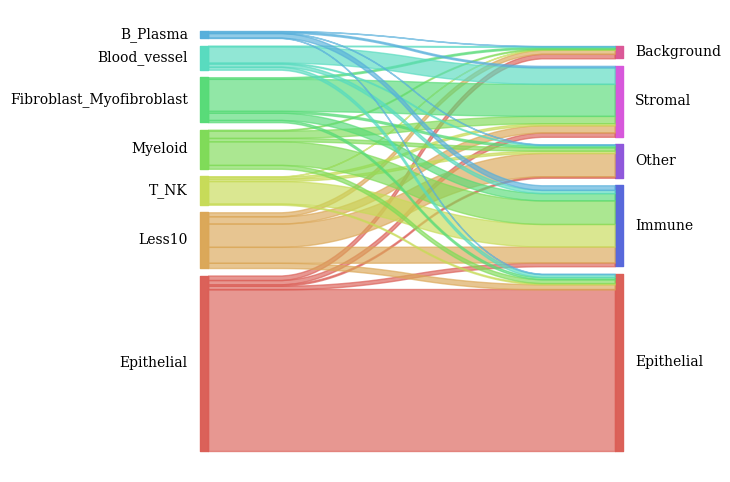

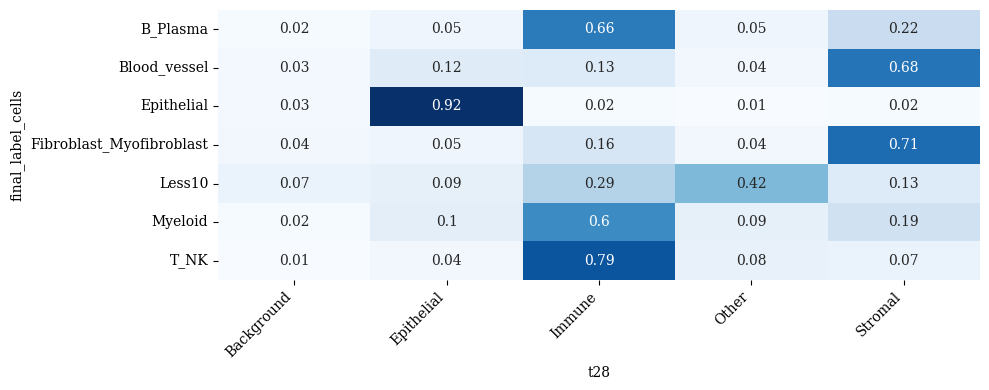

In [48]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### heart_s0

In [49]:
slide_id = 'heart_s0'

                    final_label_cells                                                  t27 label


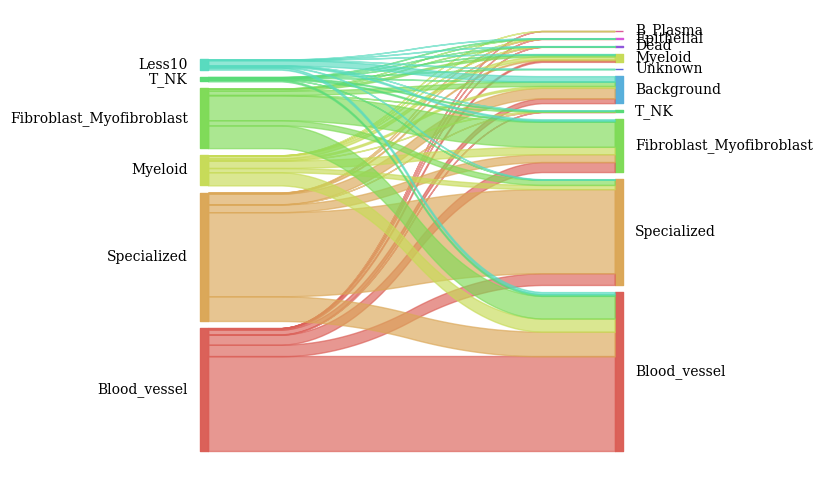

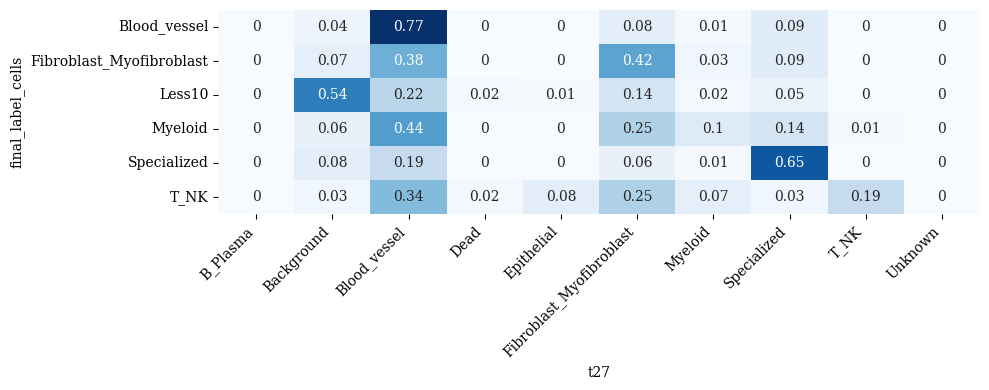

In [50]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


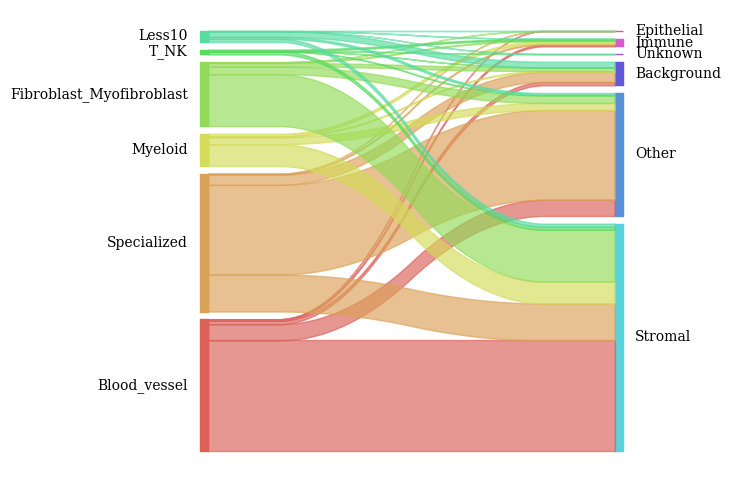

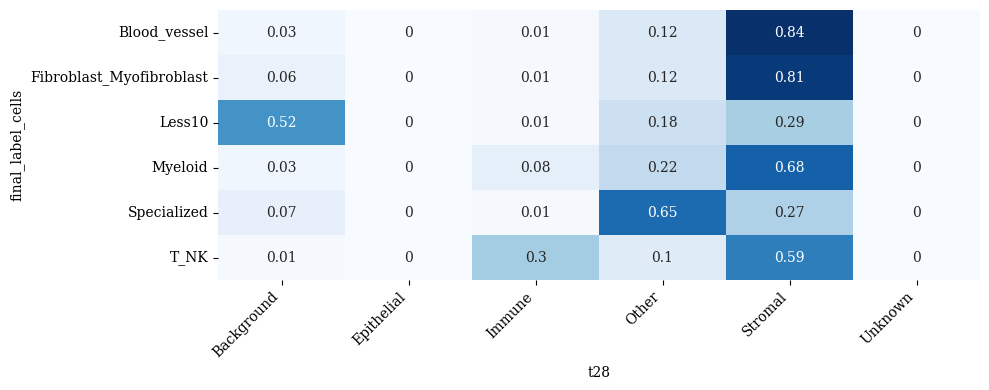

In [51]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### colon_s1

In [52]:
slide_id = 'colon_s1'

                    final_label_cells                                                  t27 label


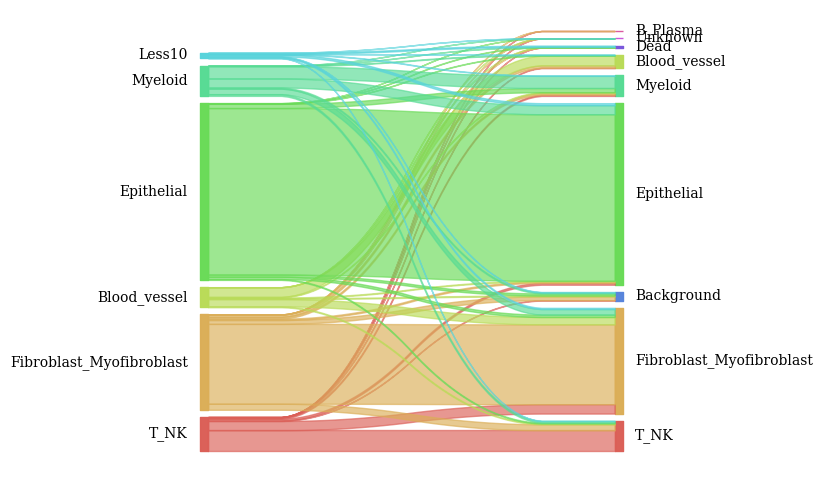

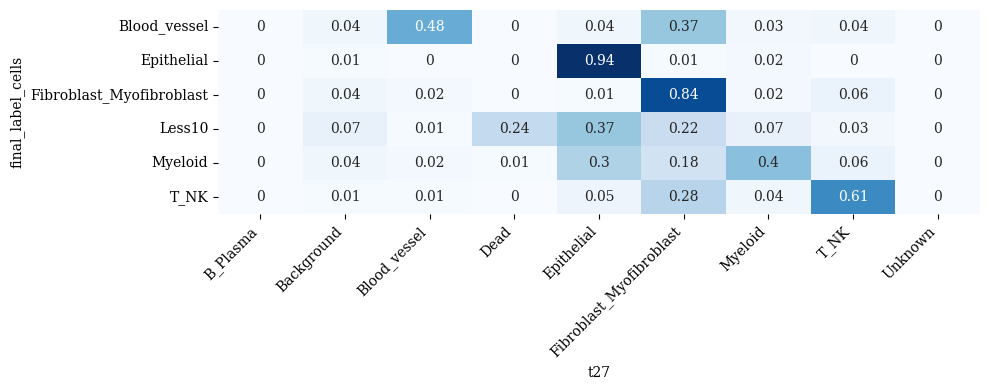

In [53]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


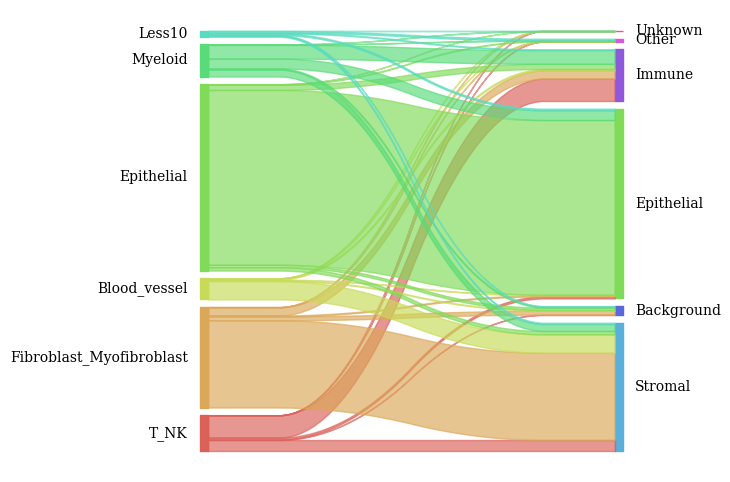

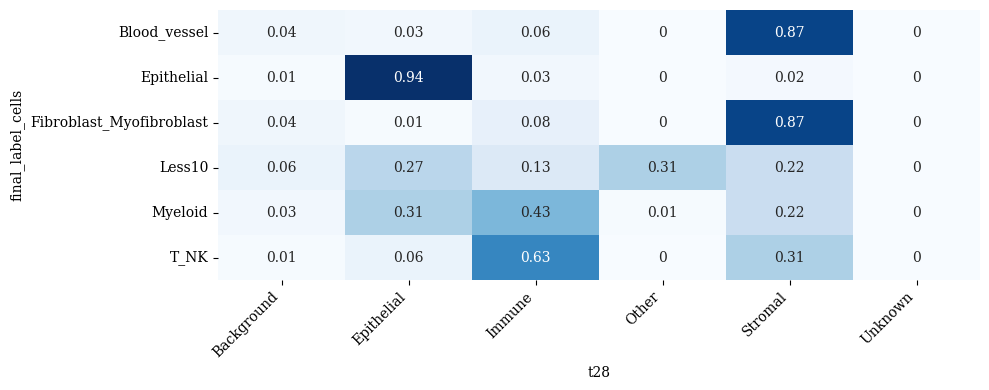

In [54]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### colon_s2

In [55]:
slide_id = 'colon_s2'

                    final_label_cells                                                  t27 label


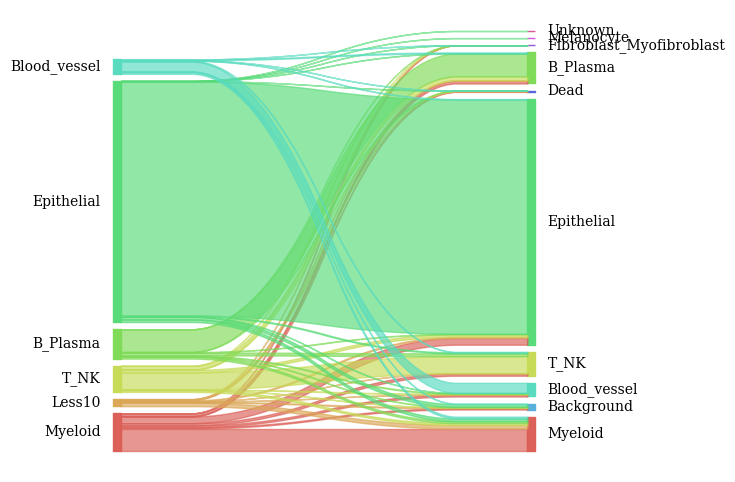

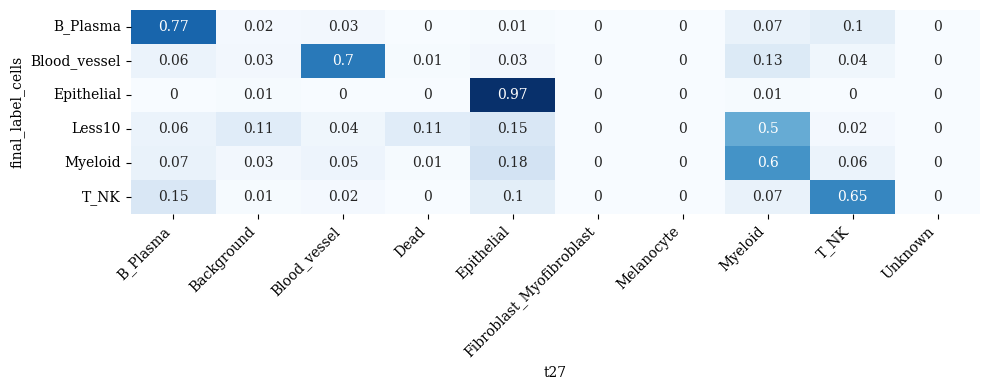

In [56]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


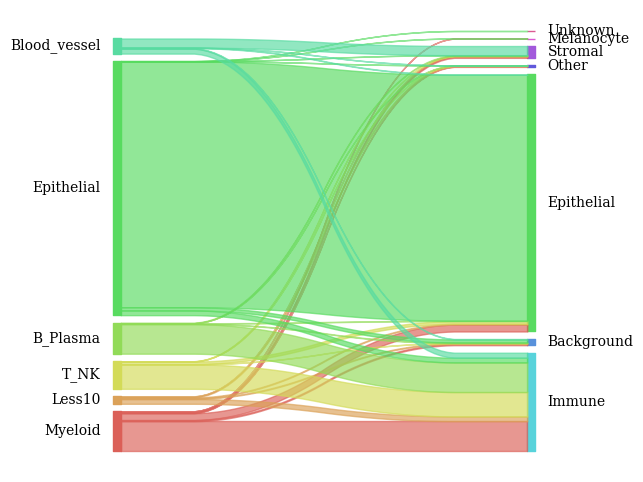

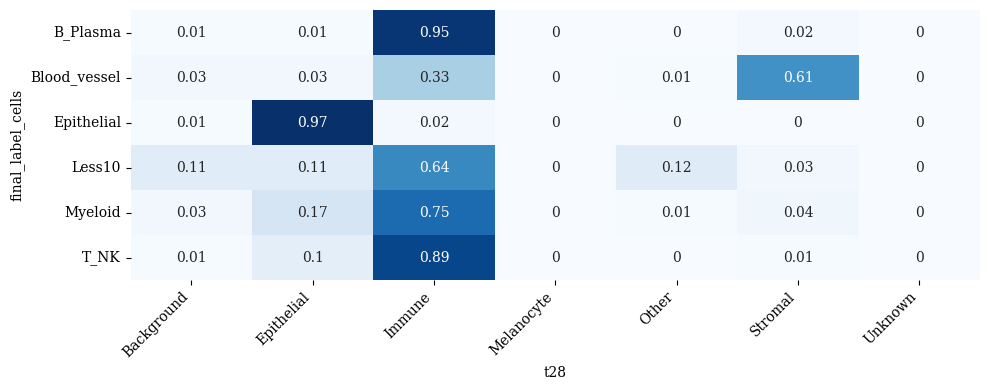

In [57]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### kidney_s0

In [58]:
slide_id = 'kidney_s0'

                    final_label_cells                                                  t27 label


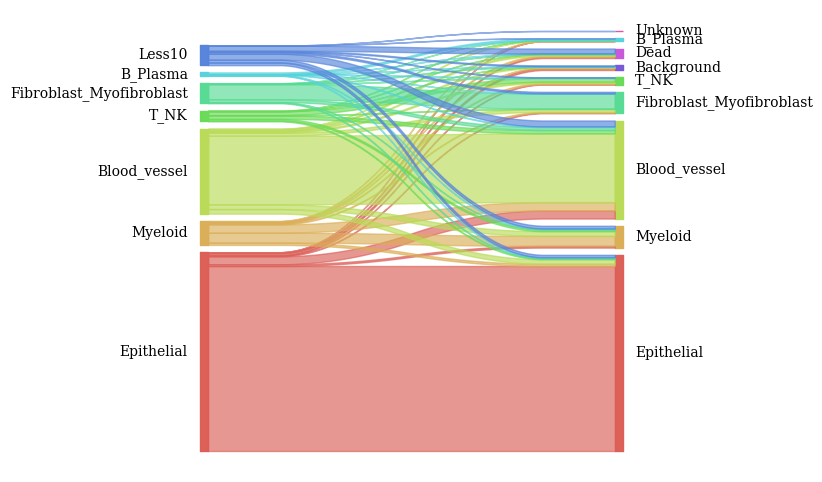

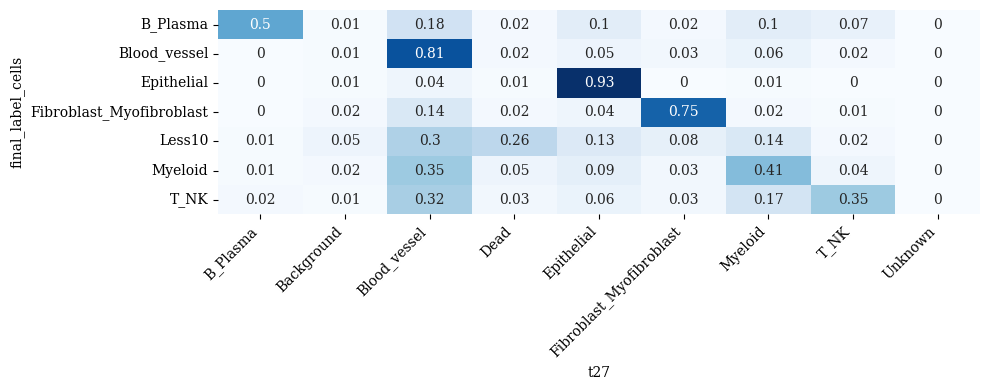

In [59]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


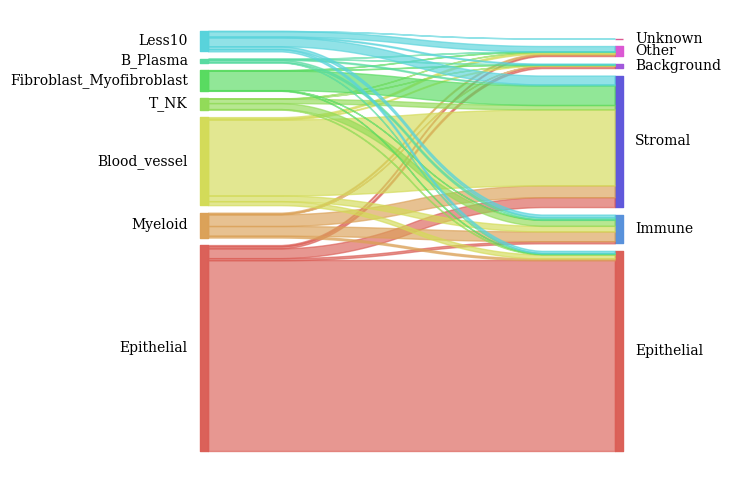

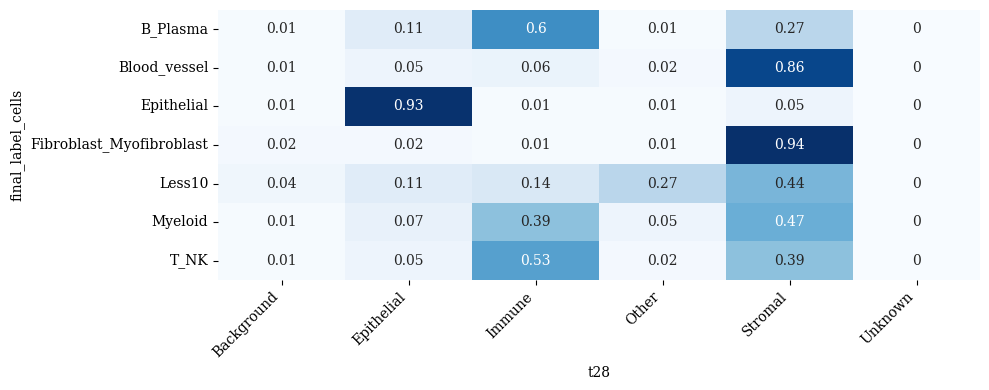

In [60]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### kidney_s1

In [61]:
slide_id = 'kidney_s1'

                    final_label_cells                                                  t27 label


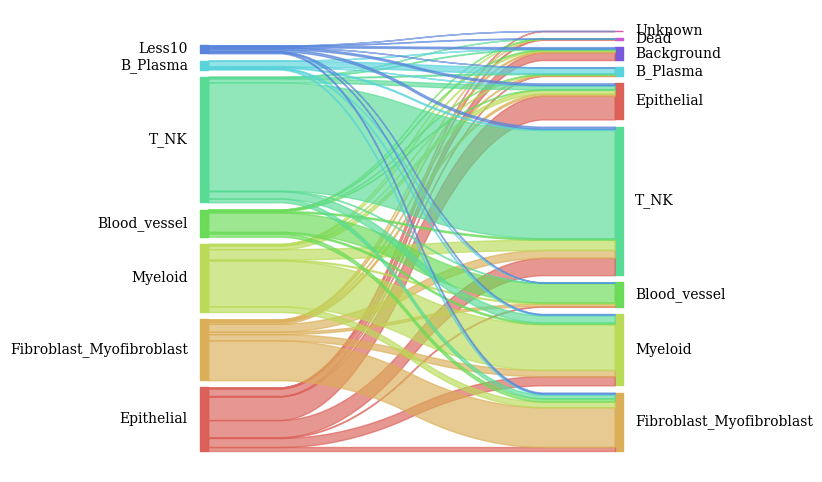

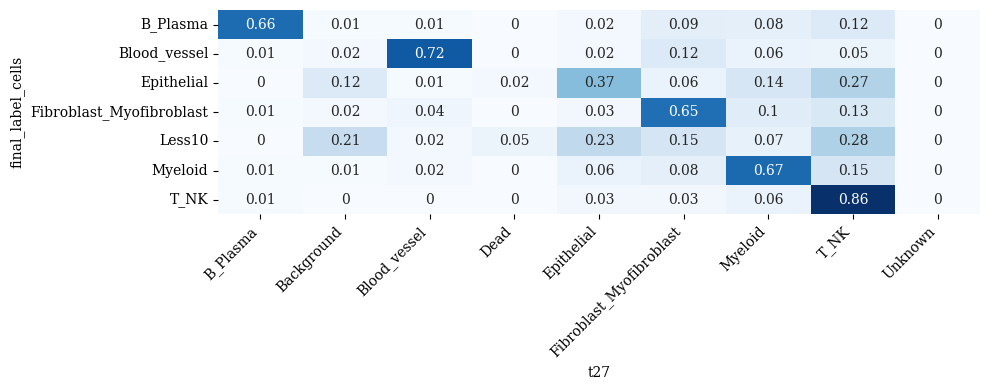

In [62]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


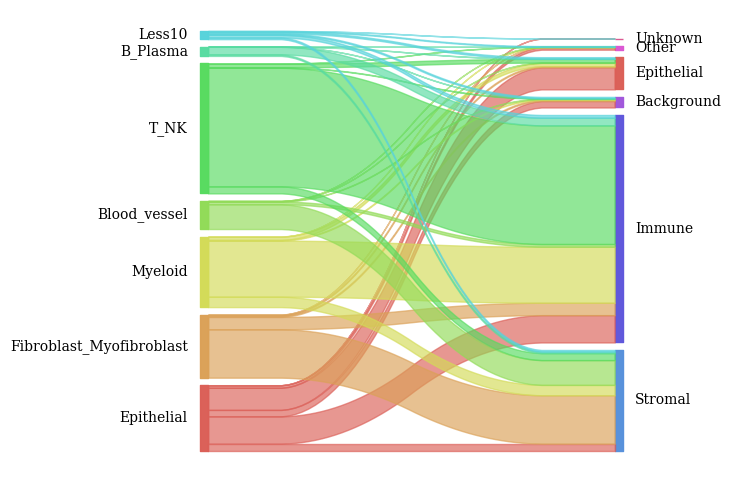

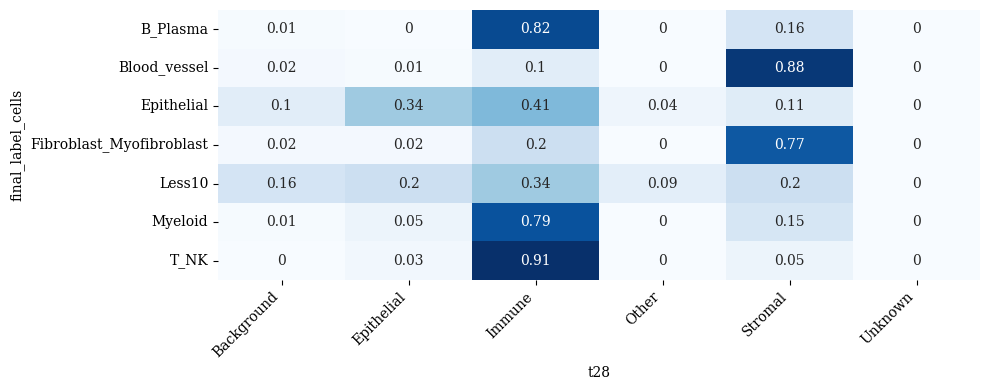

In [63]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### liver_s0

In [64]:
slide_id = 'liver_s0'

                    final_label_cells                                                  t27 label


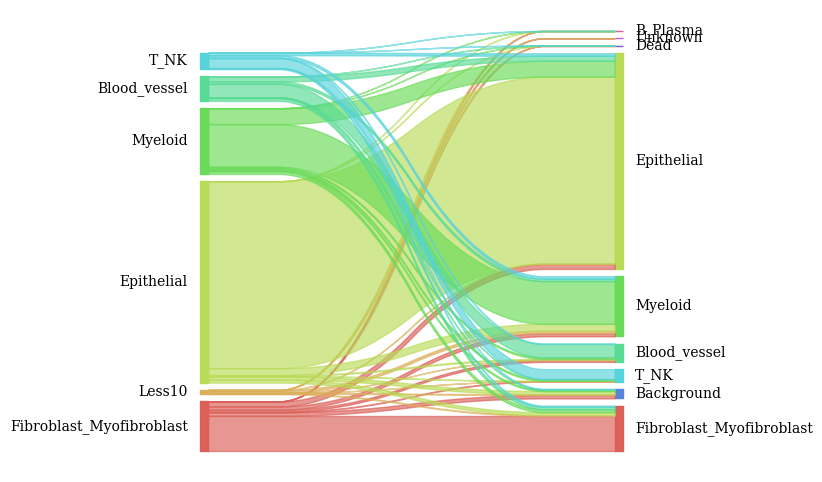

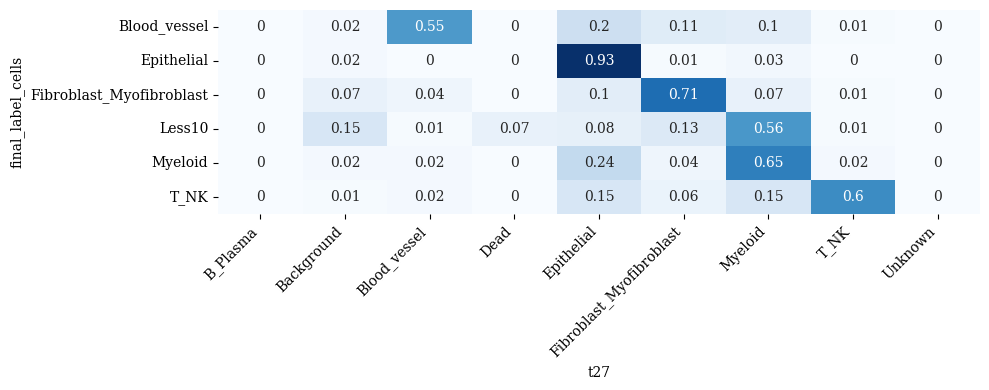

In [65]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


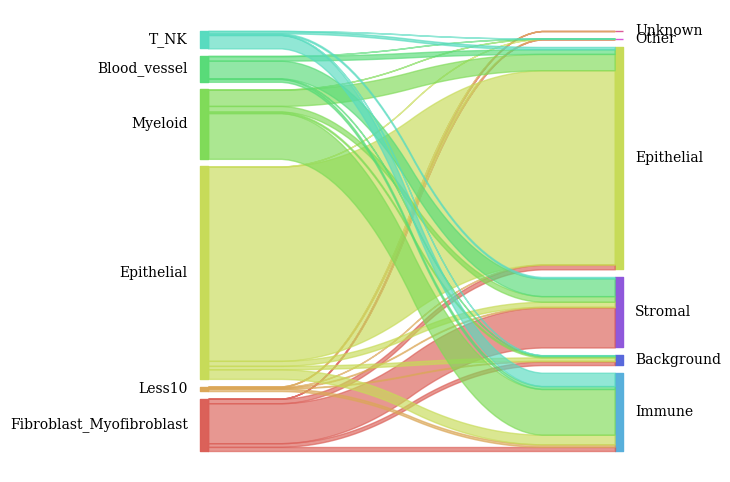

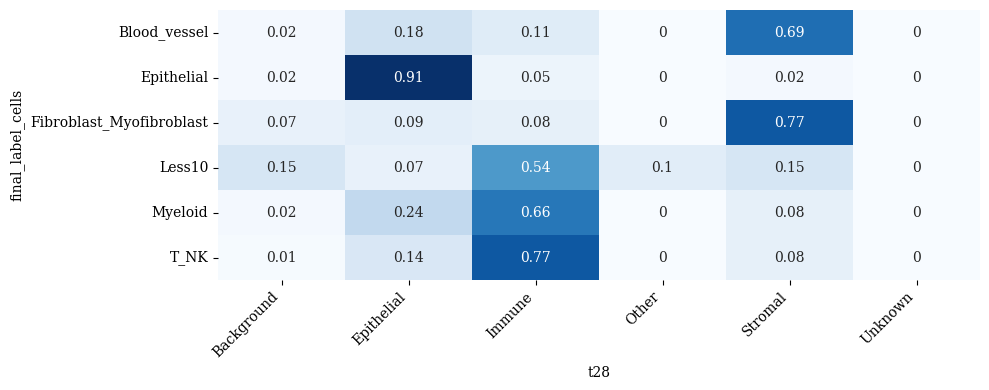

In [66]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### liver_s1

In [67]:
slide_id = 'liver_s1'

                    final_label_cells                                                  t27 label


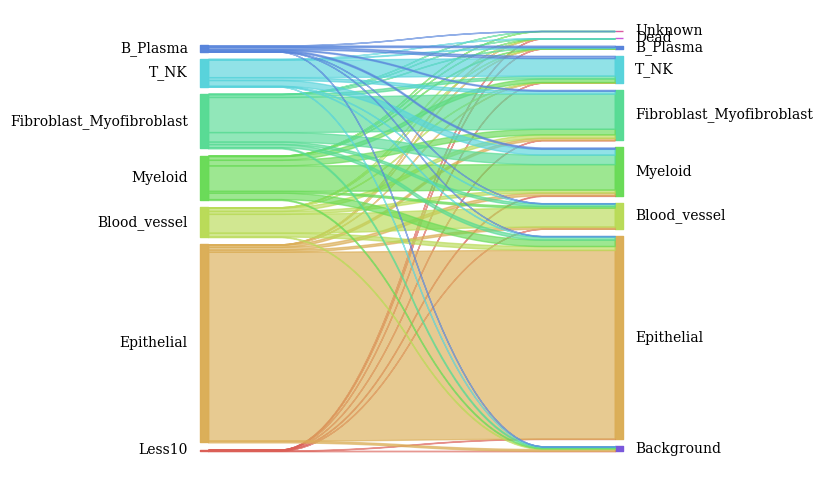

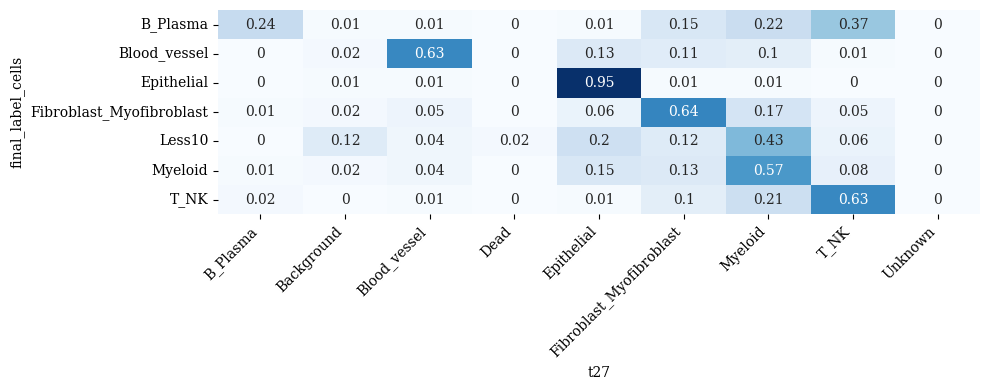

In [68]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


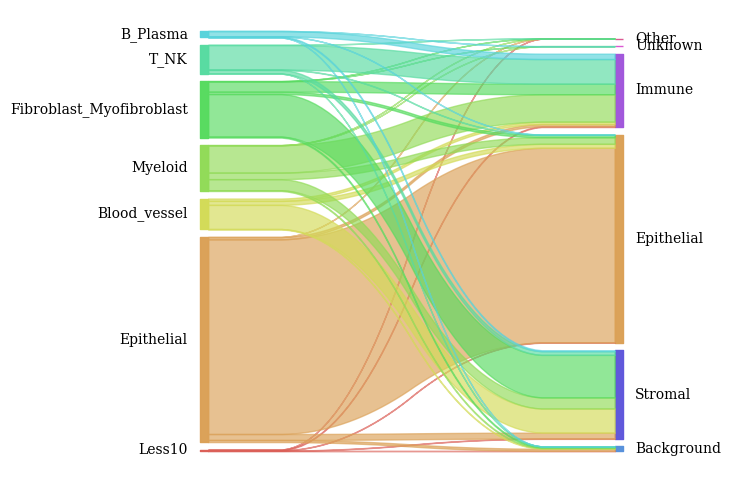

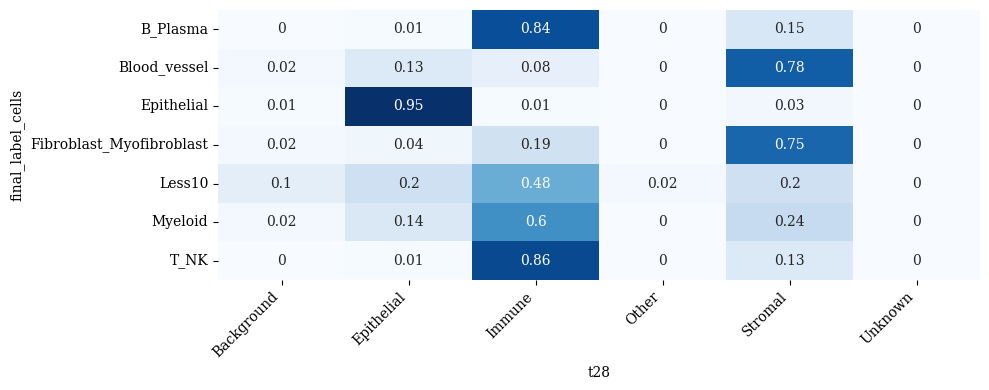

In [69]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### tonsil_s0

In [70]:
slide_id = 'tonsil_s0'

                    final_label_cells                                                  t27 label


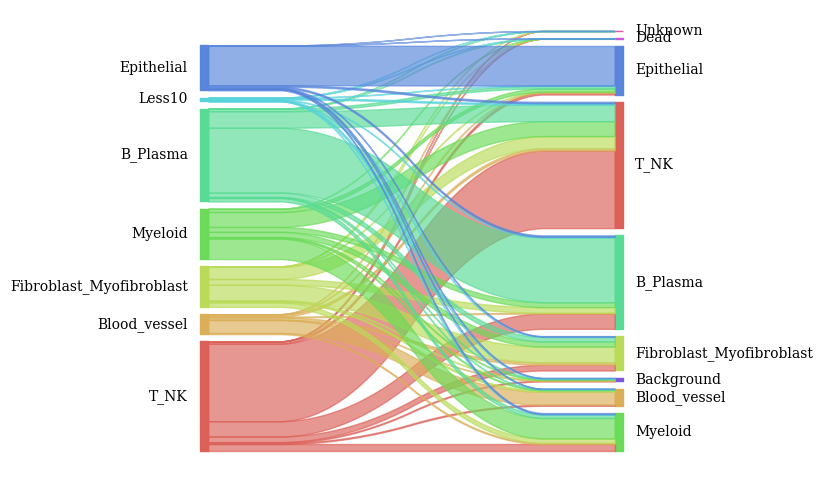

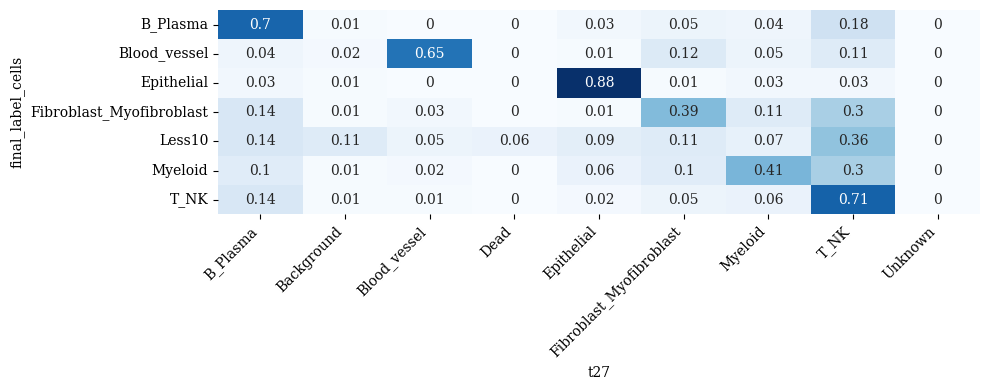

In [71]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


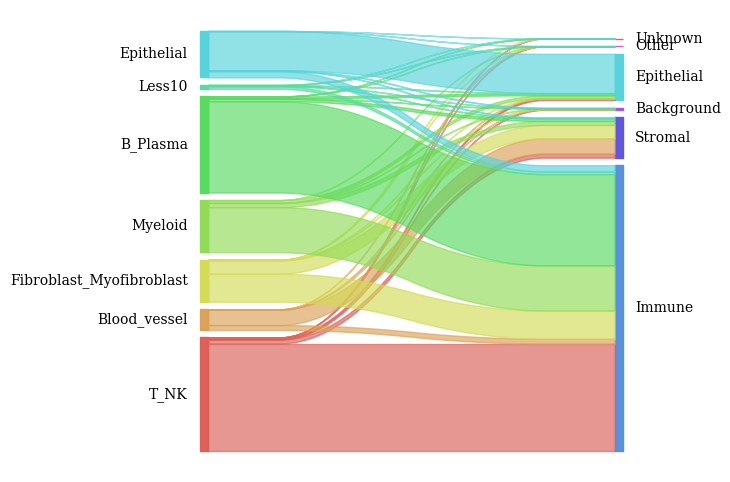

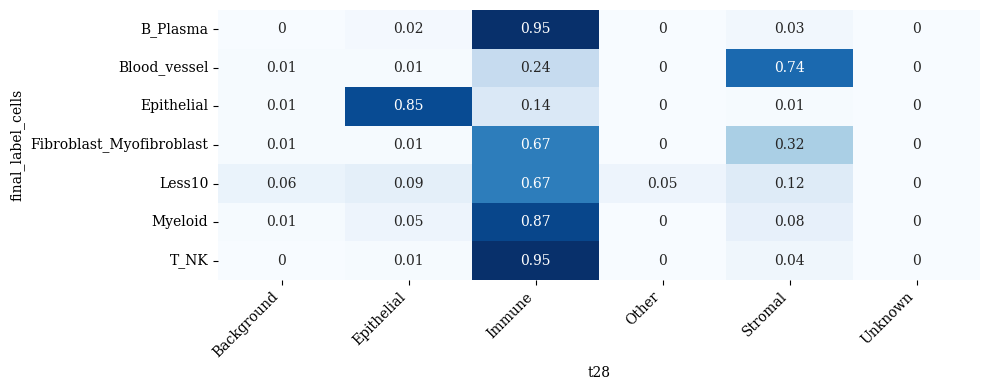

In [72]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### tonsil_s1

In [73]:
slide_id = 'tonsil_s1'

                    final_label_cells                                                  t27 label


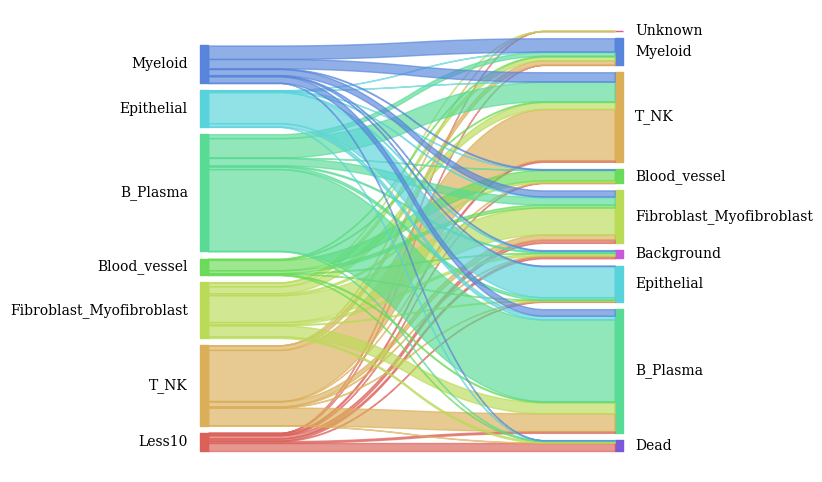

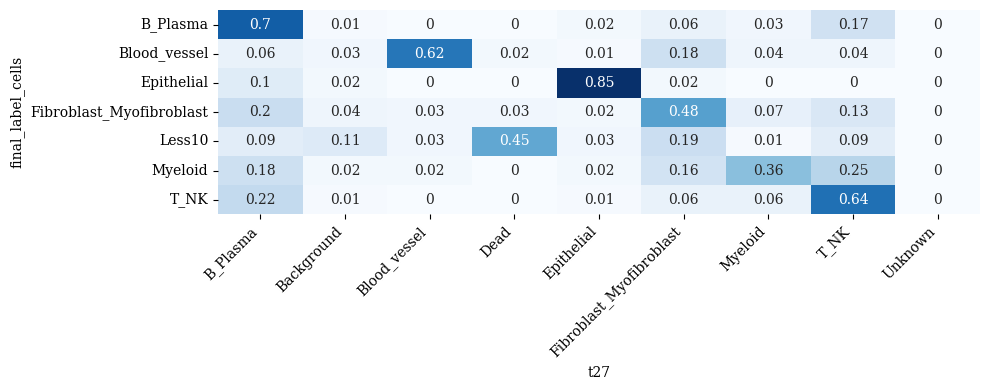

In [74]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


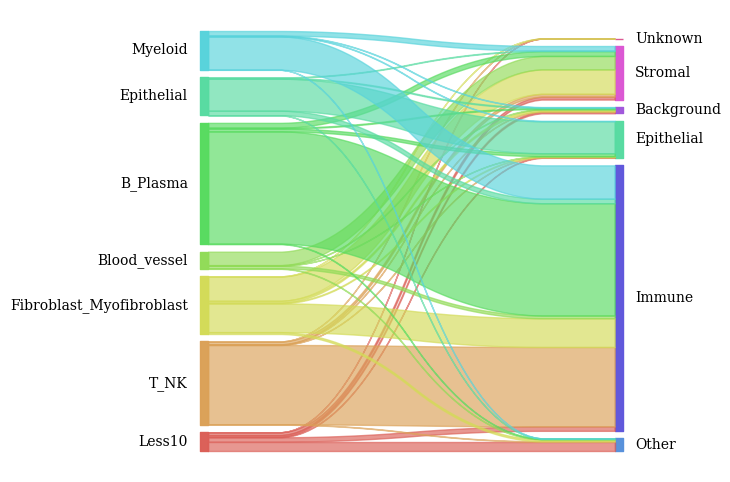

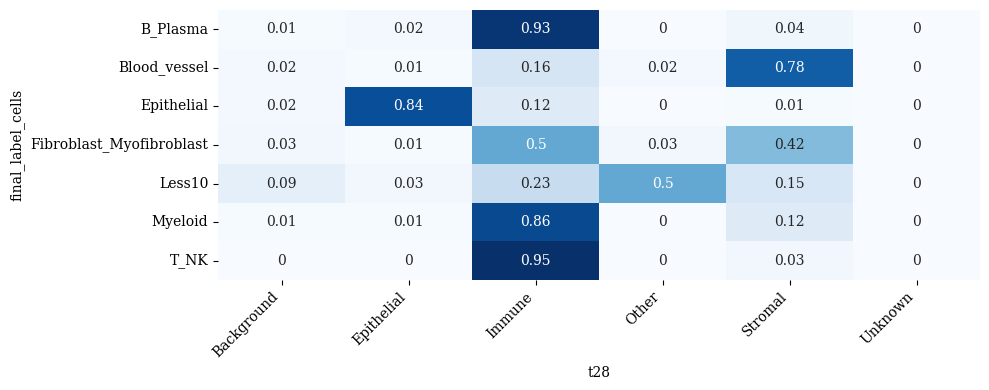

In [75]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### lymph_node_s0

In [76]:
slide_id = 'lymph_node_s0'

                    final_label_cells                                                  t27 label


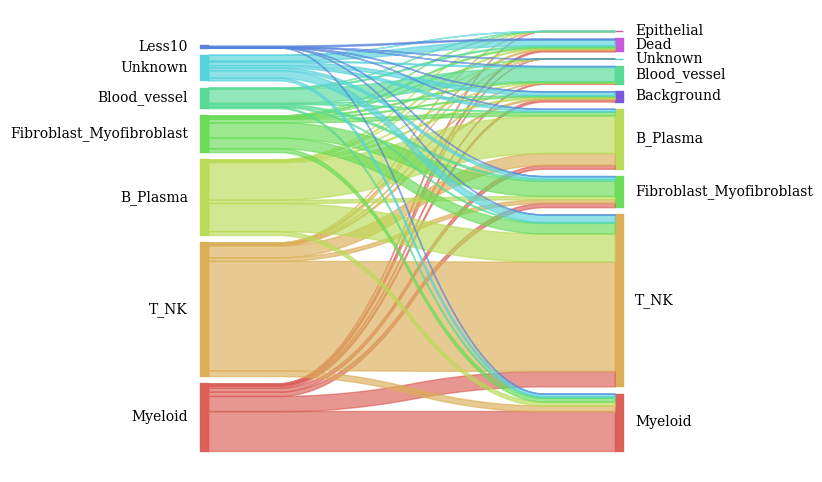

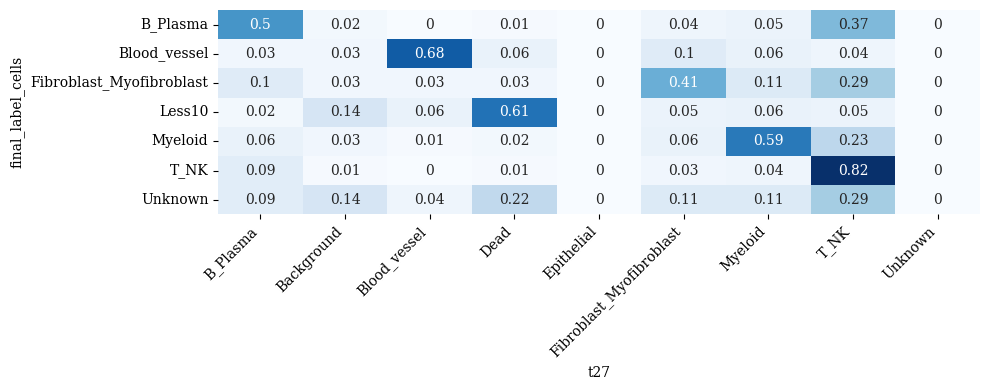

In [77]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


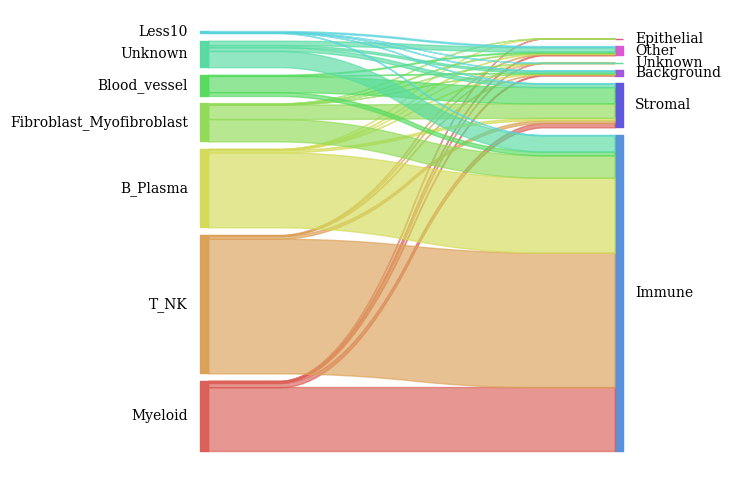

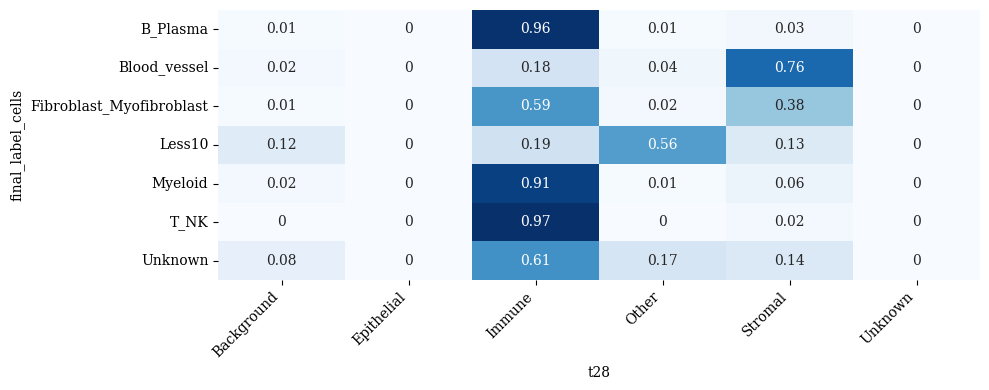

In [78]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### ovary_s0

In [79]:
slide_id = 'ovary_s0'

                    final_label_cells                                                  t27 label


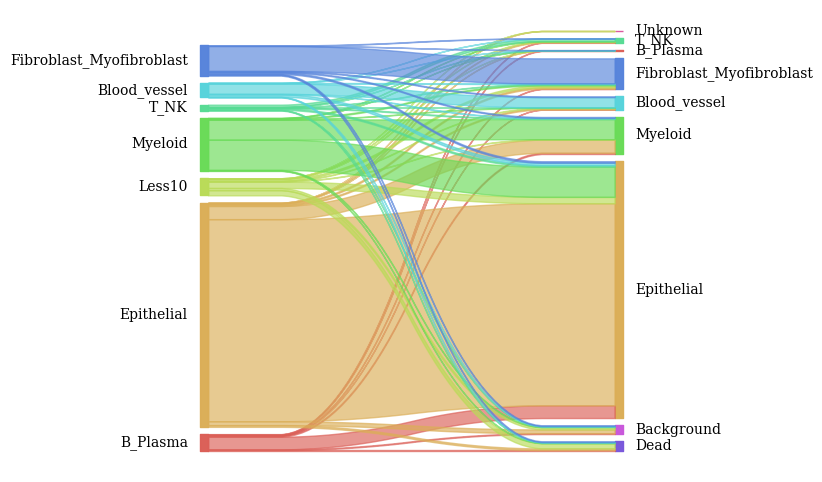

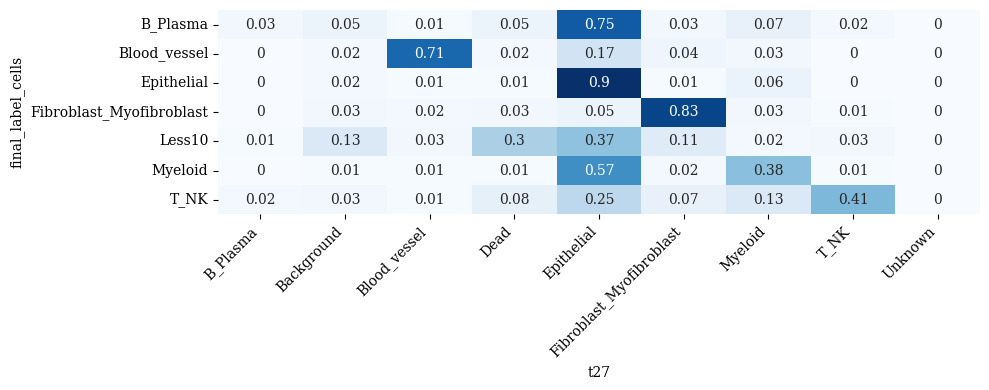

In [80]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


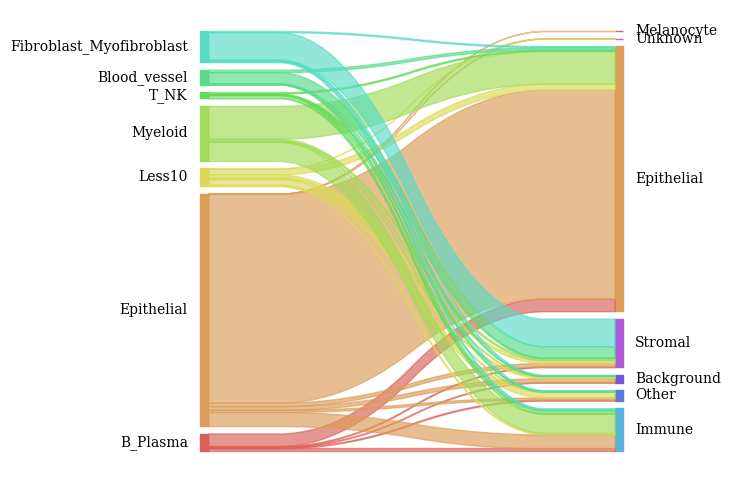

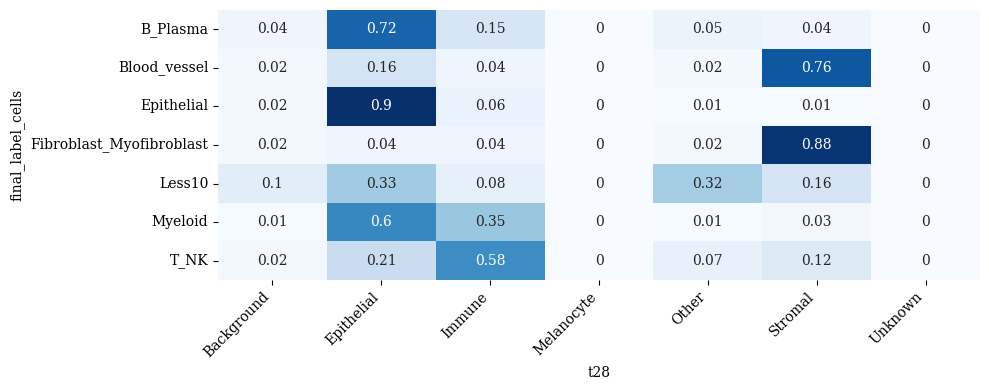

In [81]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### ovary_s1

In [82]:
slide_id = 'ovary_s1'

                    final_label_cells                                                  t27 label


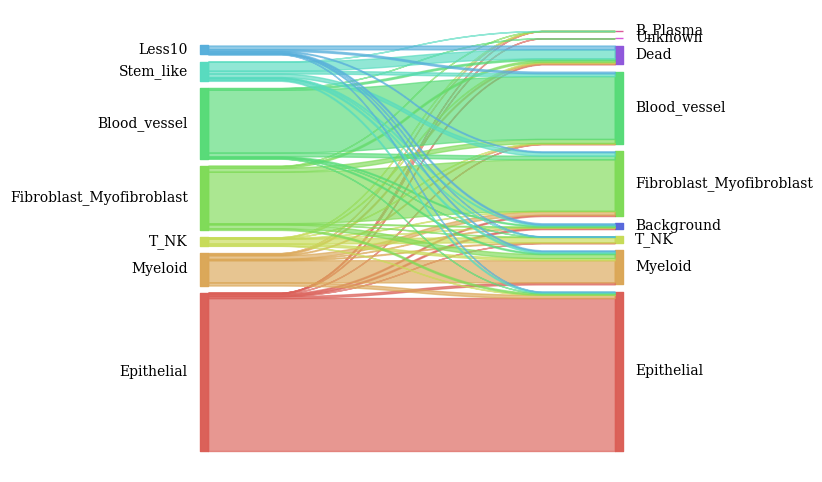

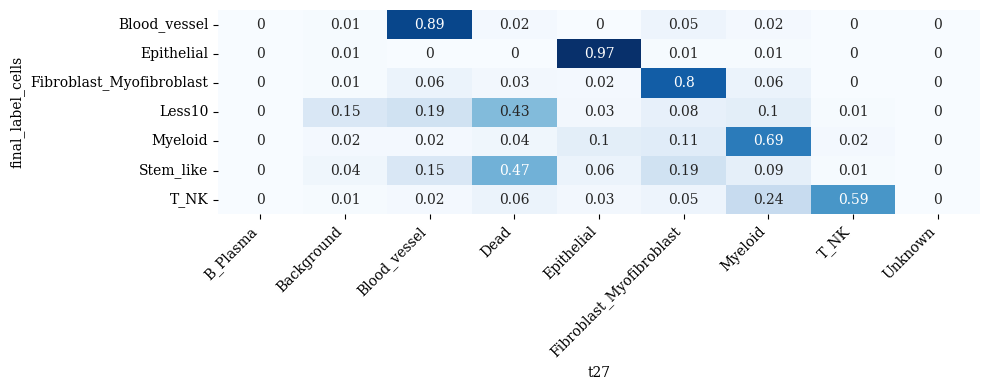

In [83]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


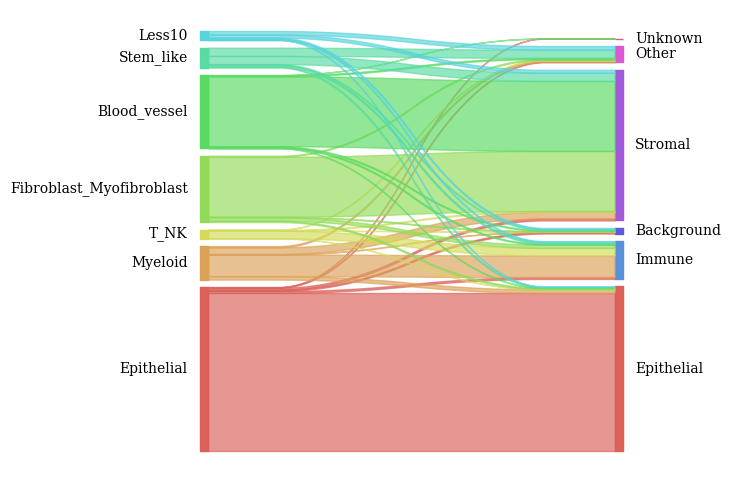

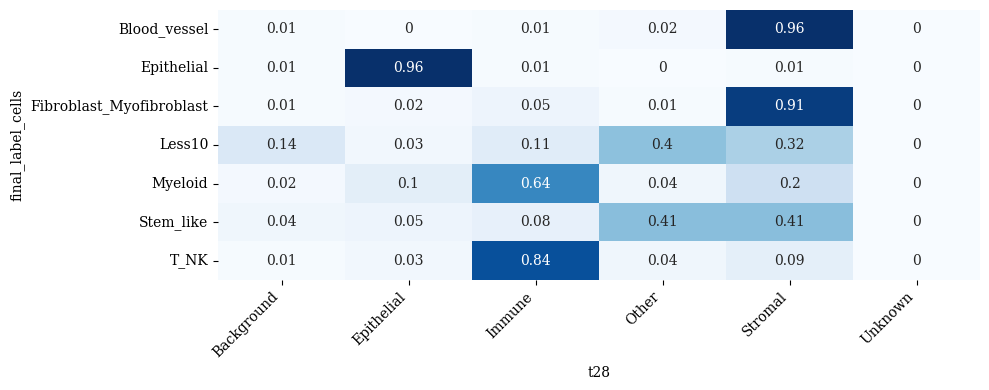

In [84]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### prostate_s0

In [85]:
slide_id = 'prostate_s0'

                    final_label_cells                                                  t27 label


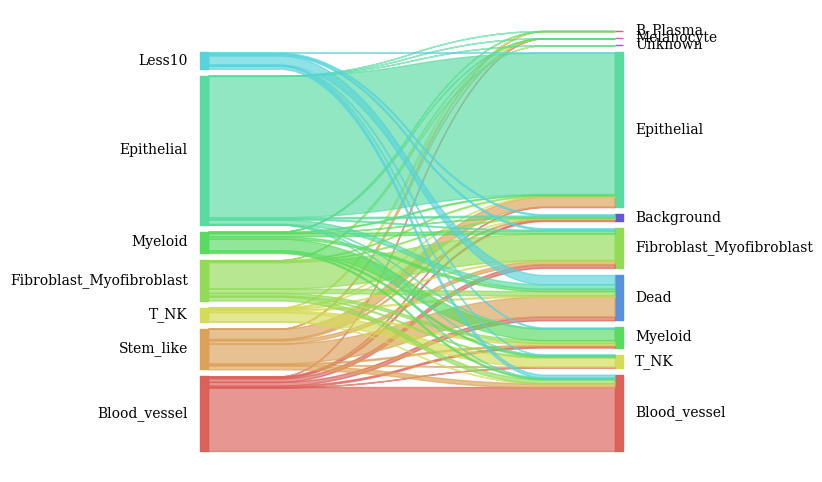

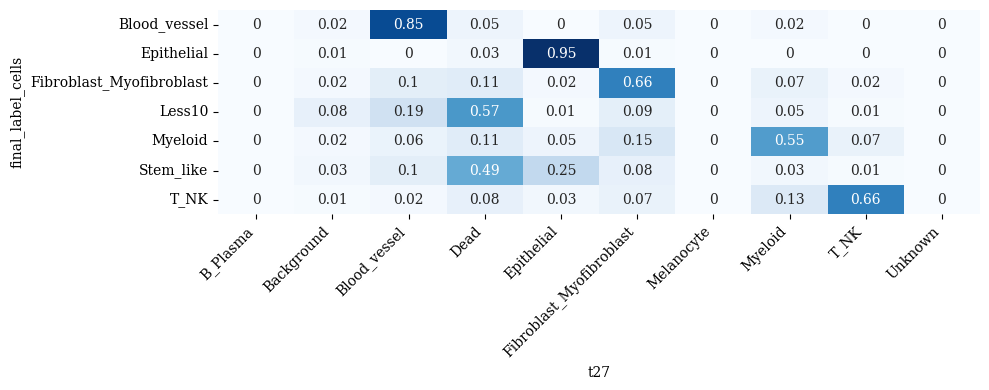

In [86]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


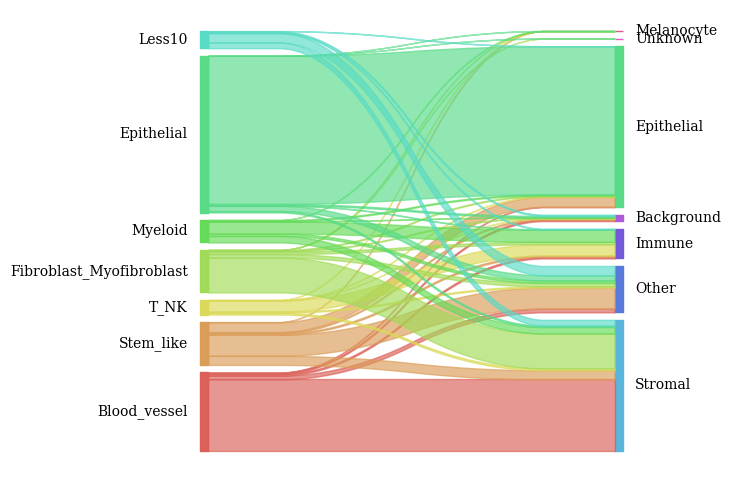

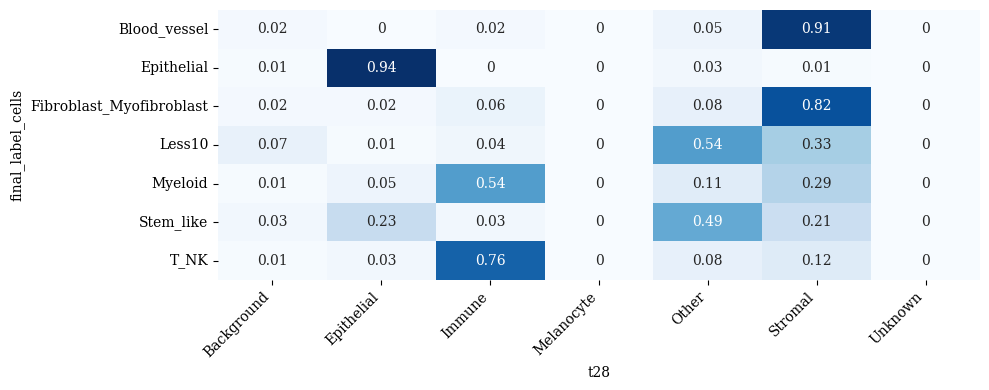

In [87]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28

### cervix_s0

In [88]:
slide_id = 'cervix_s0'

                    final_label_cells                                                  t27 label


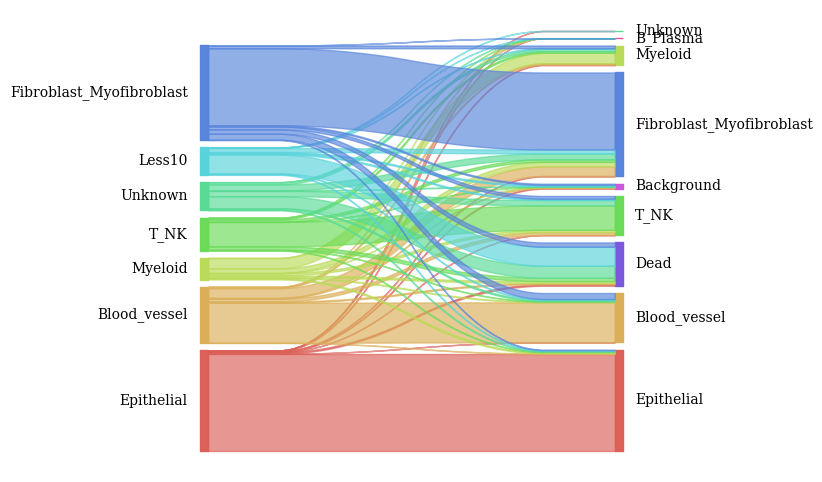

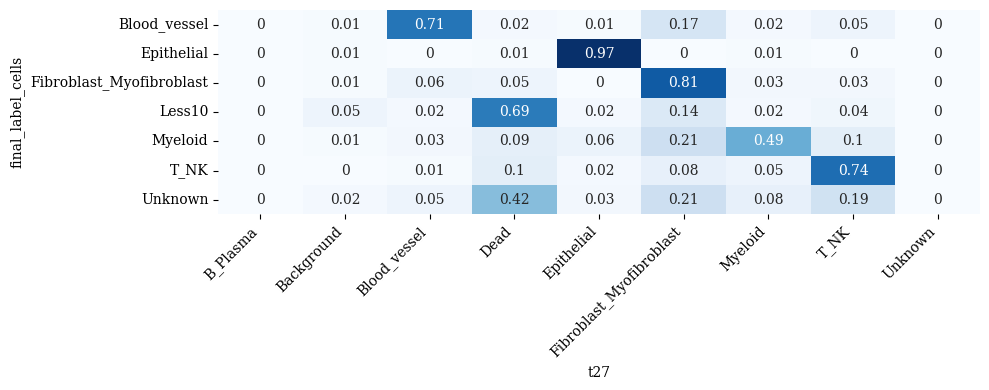

In [89]:
compare(df_labels, "final_label_cells", "t27", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_27

                    final_label_cells                                                  t28 label


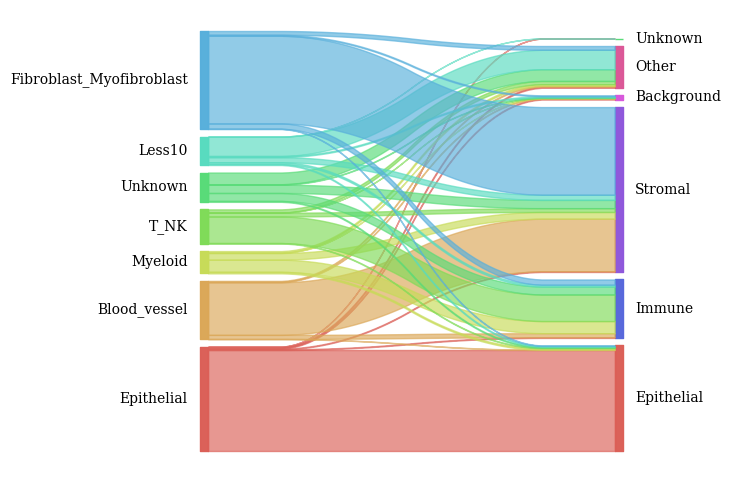

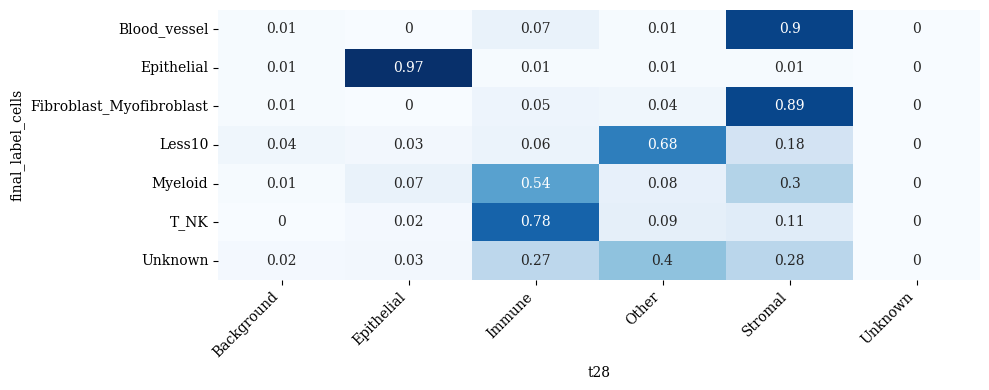

In [90]:
compare(df_labels, "final_label_cells", "t28", slide_ids=[slide_id], exclude_Less10=False, normalize='index')    # training_28